In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np 
import seaborn as sns 
#from pandas_profiling import ProfileReport 
#import sweetviz as sv
#import dtale
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import f1_score,confusion_matrix,classification_report
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
#from sklearn.pipeline import make_pipeline
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


In [2]:
DecisionTreeClassifier =DecisionTreeClassifier(random_state=0)
RandomForest =RandomForestClassifier( random_state=0)
AdaBoost = AdaBoostClassifier(random_state=0)
Regression_logistic=LogisticRegression(random_state = 0)
SVM = SVC(random_state=0)
KNN = KNeighborsClassifier()
XGboost = XGBClassifier()

In [4]:
dict_of_models = {'DecisionTreeClassifier':DecisionTreeClassifier,
                  'RandomForest': RandomForest,
                  'AdaBoost' : AdaBoost,
                  'XGboost':XGboost,
                  'Regression_logistic':Regression_logistic,
                  'SVM': SVM,
                  'KNN': KNN
                  
                 }

In [5]:
def evaluation(model):
    
    model.fit(X1_train, y1_train)
    ypred = model.predict(X1_test)
    
    print(confusion_matrix(y1_test, ypred))
    print(classification_report(y1_test, ypred))
    print('les paramètres',model.get_params)
    print('=======================================================')

In [6]:
def evaluation2(model):
    
    model.fit(X2_train, y2_train)
    y2pred = model.predict(X2_test)
    
    print(confusion_matrix(y2_test, y2pred))
    print(classification_report(y2_test, y2pred))
    print('les paramètres',model.get_params)
    print('=======================================================')

In [7]:
def evaluation_c(model):
    
    model.fit(Xc_train, yc_train)
    ycpred = model.predict(Xc_test)
    
    print(confusion_matrix(yc_test, ycpred))
    print(classification_report(yc_test, ycpred))
    print('les paramètres',model.get_params)
    print('=======================================================')

In [8]:
def evaluation_s(model):
    
    model.fit(Xs_train, ys_train)
    yspred = model.predict(Xs_test)
    
    print(confusion_matrix(ys_test, yspred))
    print(classification_report(ys_test, yspred))
    print('les paramètres',model.get_params)
    print('=======================================================')

In [9]:
def importance(evaluation,X):
    for name,model in dict_of_models.items():
        liste=['Regression_logistic','KNN','SVM']
        if name in liste:
            print(name)
            evaluation(model)
            
        else:
            print(name)
            evaluation(model)
            O=pd.DataFrame(model.feature_importances_,index=X.columns)
            O.columns=['importance']
            O.sort_values(by='importance',inplace=True,ascending=False)
            display(O)
       # N, train_score, val_score = learning_curve(model, X1_train, y1_train,
     #                                       cv=4, scoring='f1',
      #                                         train_sizes=np.linspace(0.1, 1, 10))
    #
    
     #   plt.figure(figsize=(12, 8))
      #  plt.plot(N, train_score.mean(axis=1), label='train score')
       # plt.plot(N, val_score.mean(axis=1), label='validation score')
        #plt.legend() 

In [10]:
meteo=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_meteo_Q1.xlsx',sheet_name="meteo_entpe")
meteo1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_meteo_Q1.xlsx',sheet_name = "meteo_entpe",index_col='Date')

In [11]:
df1 = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_Quivogne_Camp1N5_fen_ch1_all.txt',delimiter="\t")#,index_col='Date')
df2 = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_Quivogne_Camp1N5_fen_ch2_all.txt',delimiter="\t")
dfc = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_Quivogne_Camp1N5_fen_cuisine_all.txt',delimiter="\t")
dfs = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Donnees_Quivogne_Camp1N5_fen_salon_all.txt',delimiter="\t")


In [12]:
#regroupement des données interieurs 
df11=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N5.xlsx',sheet_name = "Ch1",index_col='Date')
df22=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N5.xlsx',sheet_name = "Ch2",index_col='Date')
dfc1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N5.xlsx',sheet_name = "Cuisine",index_col='Date')
dfs1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Quivogne campagne 1/Quivogne campagne 1/Fenetre_QuivogneC1_N5.xlsx',sheet_name = "Salon",index_col='Date')
df=pd.concat([df11,df22,dfc1,dfs1],axis=1)
#df = df.loc[:,~df.columns.duplicated()]
df.dropna(axis = 0, how = 'any',inplace=True)

print('#========================== CHAMBRE 1  ============================#')
print('date de début d enregistrement des données')
display(df11.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df11.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df11.shape)
print('\n')
print('#========================== CHAMBRE 2  ============================#')
print('date de début d enregistrement des données')
display(df22.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df22.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df22.shape)
print('\n')
print('#========================== CUISINE ==============================#')
print('date de début d enregistrement des données')
display(dfc1.index.min()),print('         ----------')
print('date de fin d enregistrement des données')
display(dfc1.index.max()),print('         ----------')
print('la dimension du dataframe de la cuisine et de:' , )
display(dfc1.shape)
print('\n')
print('#========================== SALON ================================#')
print('date de début d enregistrement des données')
display(dfs1.index.min()),print('         ----------')
print('date de fin d enregistrement des données')
display(dfs1.index.max()),print('         ----------')
print('la dimension du dataframe du salon et de:' , )
display(dfs1.shape)
print('\n')
print('#======== df résultat de concatination (ch2,cuisine,salon) =========#')
print('date de début')  
display(df.index.min()),print('         ----------')
print('date de fin')
display(df.index.max()),print('         ----------')
print('la dimension de df :' , )
display(df.shape)
print('\n')
print('                                                   df')
display(df )

#========================== CHAMBRE 1  ============================#
date de début d enregistrement des données


Timestamp('2018-12-13 17:20:00')

          ----------
date de fin d enregistrement des données


Timestamp('2019-05-22 16:40:00')

          ----------
la dimension du dataframe de la chambre  et de:


(46061, 4)



#========================== CHAMBRE 2  ============================#
date de début d enregistrement des données


Timestamp('2018-12-13 17:20:00')

          ----------
date de fin d enregistrement des données


Timestamp('2019-05-22 16:40:00')

          ----------
la dimension du dataframe de la chambre  et de:


(46061, 4)



#========================== CUISINE ==============================#
date de début d enregistrement des données


Timestamp('2018-12-13 17:15:00')

         ----------
date de fin d enregistrement des données


Timestamp('2019-05-22 16:40:00')

         ----------
la dimension du dataframe de la cuisine et de:


(46062, 3)



#========================== SALON ================================#
date de début d enregistrement des données


Timestamp('2018-12-13 17:15:00')

         ----------
date de fin d enregistrement des données


Timestamp('2019-05-22 16:30:00')

         ----------
la dimension du dataframe du salon et de:


(46060, 4)



#======== df résultat de concatination (ch2,cuisine,salon) =========#
date de début


Timestamp('2018-12-13 17:20:00')

         ----------
date de fin


Timestamp('2019-05-22 16:30:00')

         ----------
la dimension de df :


(46059, 15)



                                                   df


,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_cuisine,T_cuisine,HR_cuisine,fen_salon,T_salon,HR_salon,CO2_salon
Date,,,,,,,,,,,,,,,
2018-12-13 17:20:00,1.0,20.6,38.0,944.0,0.0,20.4,40.0,907.0,1,20.126,36.898,1.0,21.0,42.0,1020.0
2018-12-13 17:25:00,1.0,20.6,38.0,944.0,1.0,20.4,40.0,907.0,1,20.126,36.898,1.0,21.0,42.0,1020.0
2018-12-13 17:30:00,1.0,21.1,39.0,1144.0,1.0,21.0,40.0,987.0,1,22.250,38.521,1.0,21.3,41.0,1139.0
2018-12-13 17:35:00,1.0,21.1,39.0,1144.0,1.0,21.0,40.0,987.0,1,22.250,38.521,1.0,21.3,41.0,1139.0
2018-12-13 17:40:00,1.0,21.5,39.0,1178.0,1.0,21.4,39.0,1053.0,1,22.417,39.259,1.0,21.5,41.0,1182.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-22 16:10:00,1.0,22.1,46.0,981.0,1.0,22.3,49.0,1083.0,1,22.848,40.968,1.0,21.6,53.0,1384.0
2019-05-22 16:15:00,1.0,22.1,46.0,981.0,1.0,22.3,49.0,1083.0,1,22.848,40.968,1.0,21.6,53.0,1384.0
2019-05-22 16:20:00,1.0,22.1,46.0,951.0,1.0,22.3,48.0,957.0,1,22.848,40.968,1.0,21.6,52.0,1387.0


In [136]:
df1.info(),dfc.info(),dfs.info(),df2.info(),df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46061 entries, 0 to 46060
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Date     46061 non-null  object
 1   fen_ch1  46061 non-null  int64 
 2   T_ch1    46061 non-null  object
 3   HR_ch1   46061 non-null  int64 
 4   CO2_ch1  46061 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.8+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46062 entries, 0 to 46061
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Date         46062 non-null  object
 1   fen_cuisine  46062 non-null  int64 
 2   T_cuisine    46061 non-null  object
 3   HR_cuisine   46061 non-null  object
dtypes: int64(1), object(3)
memory usage: 1.4+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46060 entries, 0 to 46059
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     -------------- 

(None, None, None, None, None)

In [13]:
#=======================================#
A=meteo.loc[meteo['Date'].isin(df1['Date'])]
B=meteo.loc[meteo['Date'].isin(df2['Date'])]
C=meteo.loc[meteo['Date'].isin(dfc['Date'])]
D=meteo.loc[meteo['Date'].isin(dfs['Date'])]
#=======================================#
AA=A.reset_index()
BB=B.reset_index()
CC=C.reset_index()
DD=D.reset_index()
#=======================================#
AA.drop(['index'],axis=1,inplace=True)
BB.drop(['index'],axis=1,inplace=True)
CC.drop(['index'],axis=1,inplace=True)
DD.drop(['index'],axis=1,inplace=True)
#========================================#
df1=pd.concat([AA,df1],axis=1)
df1 = df1.loc[:,~df1.columns.duplicated()]
          #================#
df2=pd.concat([BB,df2],axis=1)
df2 = df2.loc[:,~df2.columns.duplicated()]
          #================#      
dfc=pd.concat([CC,dfc],axis=1)
dfc = dfc.loc[:,~dfc.columns.duplicated()]
          #================#
dfs=pd.concat([DD,dfs],axis=1)
dfs = dfs.loc[:,~dfs.columns.duplicated()]
#========================================#

In [14]:
df1['T_ch1'].replace(',','.',regex=True,inplace=True)
df1['T_ch1']=df1['T_ch1'].astype(float)
##==========================================##
df2['T_ch2'].replace(',','.',regex=True,inplace=True)
df2['T_ch2']=df2['T_ch2'].astype(float)
##==========================================##
dfc['T_cuisine'].replace(',','.',regex=True,inplace=True)
dfc['T_cuisine']=dfc['T_cuisine'].astype(float)
                 #===========#
dfc['HR_cuisine'].replace(',','.',regex=True,inplace=True)
dfc['HR_cuisine']=dfc['HR_cuisine'].astype(float)
##==========================================##
dfs['T_salon'].replace(',','.',regex=True,inplace=True)
dfs['T_salon']=dfs['T_salon'].astype(float)

In [51]:
print("Statistiques descriptive des données de la chambre 1")
display(df1.describe()),
print('\n')
print("Statistiques descriptive des données de la chambre 2")
display(df2.describe()),
print('\n')
print("Statistiques descriptive des données de la cuisine")
display(dfc.describe()),
print('\n')
print("Statistiques descriptive des données du salon")
display(dfs.describe())

Statistiques descriptive des données de la chambre 1


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_ch1,T_ch1,HR_ch1,CO2_ch1
count,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000
mean,13166.968737,5595.301079,65.226417,192.059617,1.909830,8.058937,0.990903,21.114344,41.978984,763.497992
std,23029.279521,9447.256831,18.889747,115.459797,1.707002,5.437848,0.094943,0.915581,5.720649,378.589721
min,-99.000000,-99.000000,10.000000,0.000000,0.000000,-4.200000,0.000000,18.000000,26.000000,379.000000
25%,0.000000,0.000000,51.000000,85.000000,0.700000,3.600000,1.000000,20.500000,38.000000,472.000000
50%,15.000000,0.000000,68.000000,186.000000,1.500000,7.800000,1.000000,21.200000,41.000000,599.000000
75%,16150.000000,9060.000000,80.000000,311.000000,2.700000,11.900000,1.000000,21.700000,45.000000,995.000000
max,125700.000000,70565.000000,96.000000,360.000000,13.300000,26.300000,1.000000,24.100000,63.000000,3789.000000




Statistiques descriptive des données de la chambre 2


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_ch2,T_ch2,HR_ch2,CO2_ch2
count,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000,46061.000000
mean,13166.968737,5595.301079,65.226417,192.059617,1.909830,8.058937,0.975424,21.188242,41.595189,680.169818
std,23029.279521,9447.256831,18.889747,115.459797,1.707002,5.437848,0.154831,0.881865,5.729440,241.308802
min,-99.000000,-99.000000,10.000000,0.000000,0.000000,-4.200000,0.000000,18.700000,26.000000,384.000000
25%,0.000000,0.000000,51.000000,85.000000,0.700000,3.600000,1.000000,20.600000,38.000000,477.000000
50%,15.000000,0.000000,68.000000,186.000000,1.500000,7.800000,1.000000,21.200000,41.000000,586.000000
75%,16150.000000,9060.000000,80.000000,311.000000,2.700000,11.900000,1.000000,21.800000,45.000000,879.000000
max,125700.000000,70565.000000,96.000000,360.000000,13.300000,26.300000,1.000000,24.600000,60.000000,4507.000000




Statistiques descriptive des données de la cuisine


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_cuisine,T_cuisine,HR_cuisine
count,46062.000000,46062.000000,46062.000000,46062.000000,46062.000000,46062.000000,46062.000000,46061.000000,46061.000000
mean,13166.683210,5595.179931,65.226803,192.055621,1.909822,8.058736,0.978594,21.755209,41.083458
std,23029.111066,9447.190059,18.889723,115.461729,1.706985,5.437960,0.144735,0.827344,4.626974
min,-99.000000,-99.000000,10.000000,0.000000,0.000000,-4.200000,0.000000,16.558000,25.227000
25%,0.000000,0.000000,51.000000,85.000000,0.700000,3.525000,1.000000,21.199000,37.988000
50%,15.000000,0.000000,68.000000,186.000000,1.500000,7.800000,1.000000,21.795000,40.968000
75%,16150.000000,9059.750000,80.000000,311.000000,2.700000,11.900000,1.000000,22.321000,43.539000
max,125700.000000,70565.000000,96.000000,360.000000,13.300000,26.300000,1.000000,27.087000,93.941000




Statistiques descriptive des données du salon


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fen_salon,T_salon,HR_salon,CO2_salon
count,46060.000000,46060.000000,46060.000000,46060.000000,46060.000000,46060.000000,46060.000000,46059.000000,46059.000000,46059.000000
mean,13164.818324,5594.883825,65.228333,192.063721,1.909750,8.058133,0.947503,21.121470,42.030266,706.292907
std,23027.871774,9447.288289,18.888707,115.457685,1.706987,5.437307,0.223029,0.821324,5.014040,278.886007
min,-99.000000,-99.000000,10.000000,0.000000,0.000000,-4.200000,0.000000,17.900000,24.000000,367.000000
25%,0.000000,0.000000,51.000000,85.000000,0.700000,3.500000,1.000000,20.600000,39.000000,467.000000
50%,15.000000,0.000000,68.000000,186.000000,1.500000,7.800000,1.000000,21.200000,42.000000,609.000000
75%,16150.000000,9056.750000,80.000000,311.000000,2.700000,11.900000,1.000000,21.600000,45.000000,922.000000
max,125700.000000,70565.000000,96.000000,360.000000,13.300000,26.300000,1.000000,24.400000,59.000000,4943.000000


In [18]:
df1['Date'].min(),df1['Date'].max()

(Timestamp('2018-12-13 17:20:00'), Timestamp('2019-05-22 16:40:00'))

In [31]:
df2['Date'].min(),df2['Date'].max()

(Timestamp('2018-12-13 17:20:00'), Timestamp('2019-05-22 16:40:00'))

In [32]:
dfc['Date'].min(),dfc['Date'].max()

(Timestamp('2018-12-13 17:15:00'), Timestamp('2019-05-22 16:40:00'))

In [33]:
dfs['Date'].min(),dfs['Date'].max()


(Timestamp('2018-12-13 17:15:00'), Timestamp('2019-05-22 16:30:00'))

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

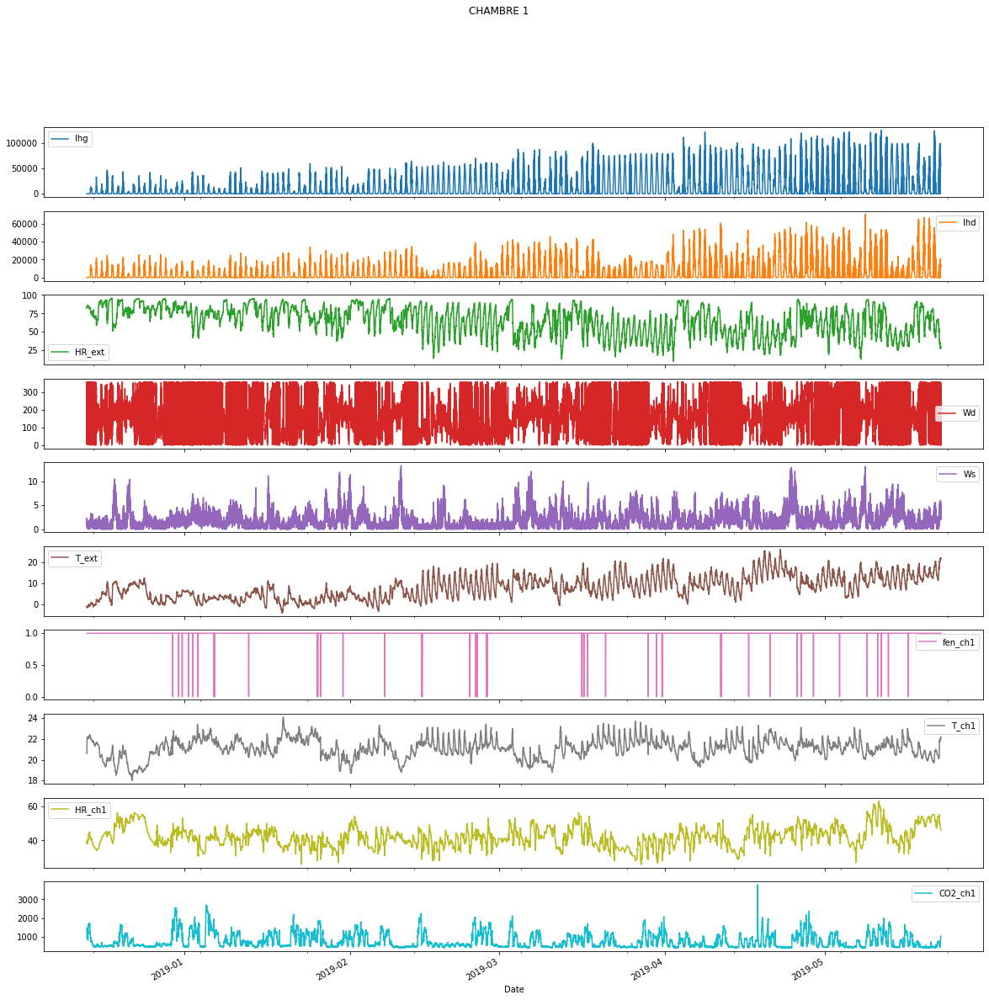

In [22]:
df1.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='CHAMBRE 1')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

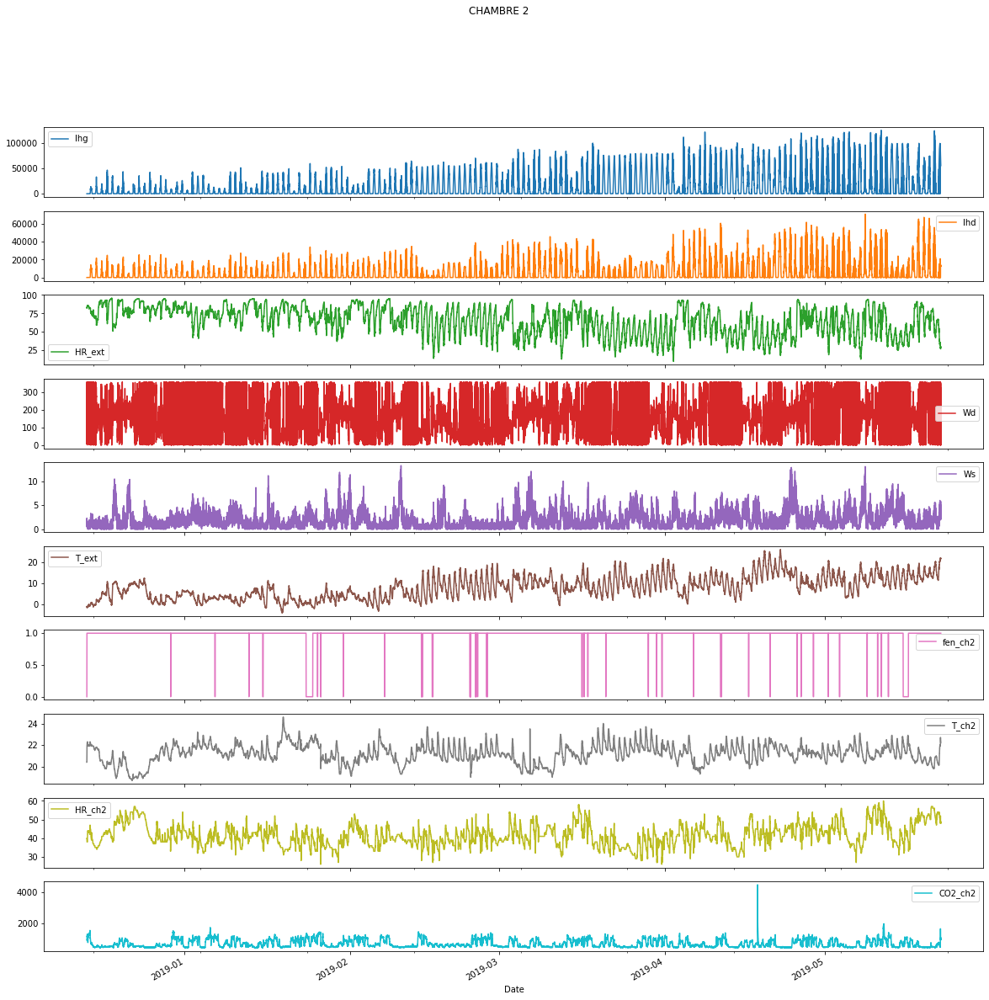

In [14]:
df2.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='CHAMBRE 2')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

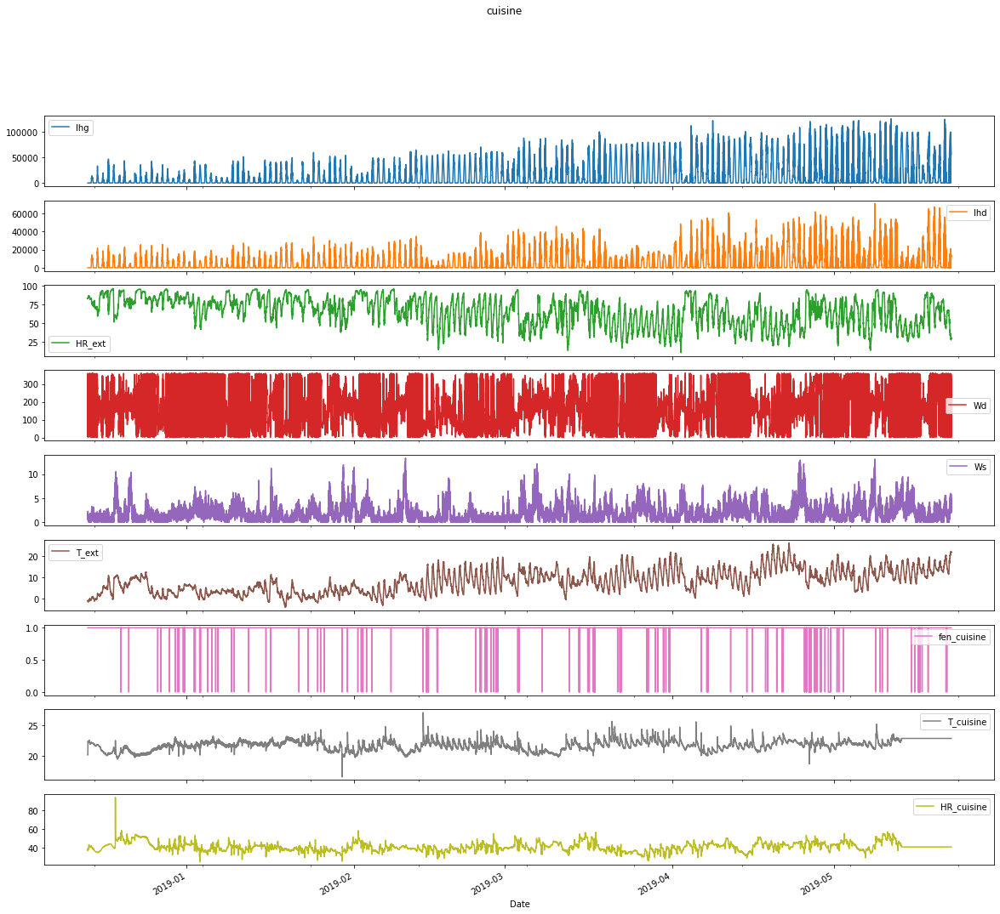

In [17]:
dfc.plot(x='Date',x_compat=True,subplots=True,figsize=(20,18),title='cuisine')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

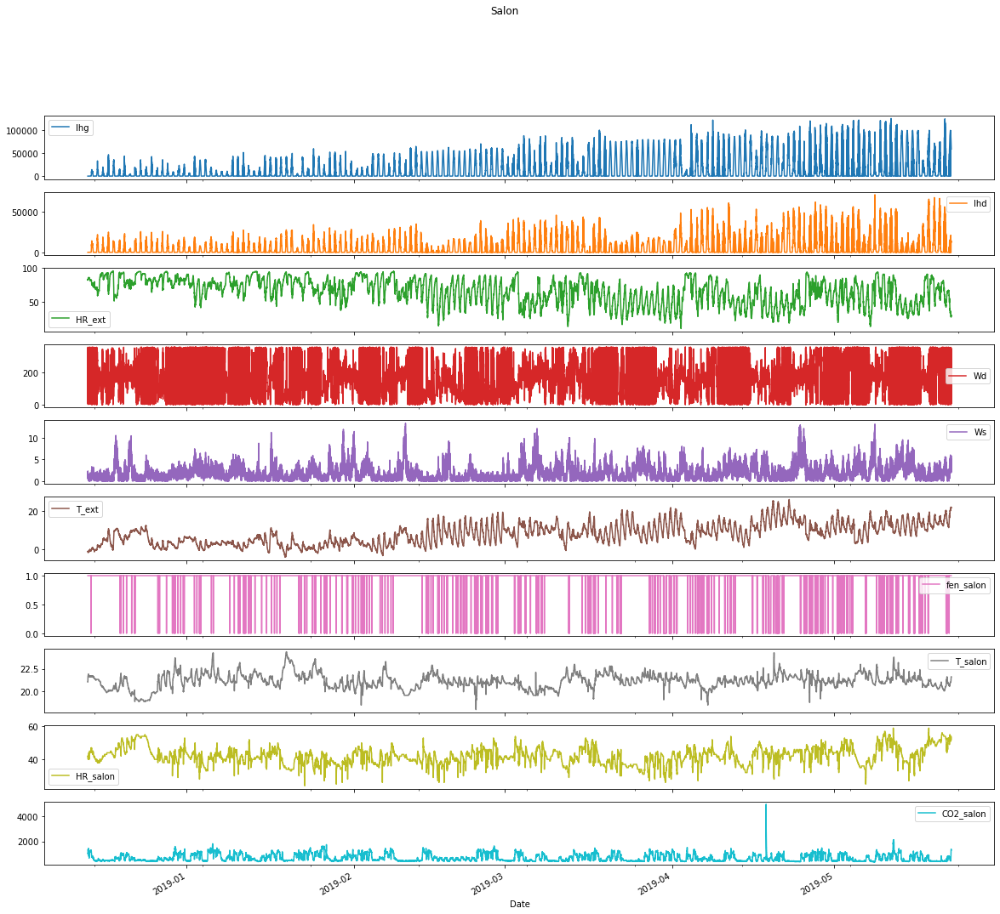

In [20]:
dfs.plot(x='Date',x_compat=True,subplots=True,figsize=(20,18),title='Salon')

(<AxesSubplot:title={'center':'Camp1N5'}, ylabel='fen_ch1'>,
 1    0.990903
 0    0.009097
 Name: fen_ch1, dtype: float64)

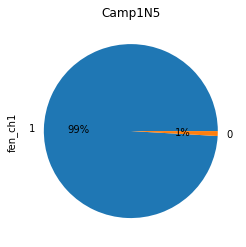

In [15]:
df1['fen_ch1'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp1N5'),df1['fen_ch1'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp1N5'}, ylabel='fen_ch2'>,
 1    0.975424
 0    0.024576
 Name: fen_ch2, dtype: float64)

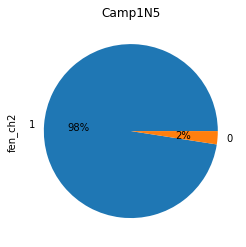

In [22]:
df2['fen_ch2'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp1N5'),df2['fen_ch2'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp1N5'}, ylabel='fen_cuisine'>,
 1    0.978594
 0    0.021406
 Name: fen_cuisine, dtype: float64)

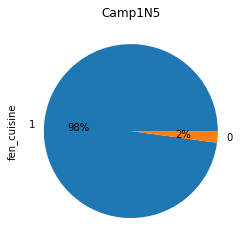

In [23]:
dfc['fen_cuisine'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp1N5'),dfc['fen_cuisine'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'Camp1N4'}, ylabel='fen_salon'>,
 1    0.947503
 0    0.052497
 Name: fen_salon, dtype: float64)

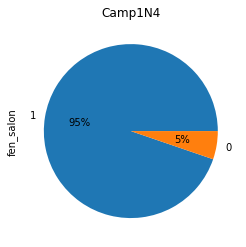

In [24]:
dfs['fen_salon'].value_counts().plot.pie(autopct='%1.0f%%',title='Camp1N4'),dfs['fen_salon'].value_counts(normalize=True)

In [17]:
f1_df = df1[df1['fen_ch1']==1]
f2_df = df2[df2['fen_ch2']==1]
fc_df = dfc[dfc['fen_cuisine']==1]
fs_df = dfs[dfs['fen_salon']==1]

In [18]:
o1_df = df1[df1['fen_ch1']==0]
o2_df = df2[df2['fen_ch2']==0]
oc_df = dfc[dfc['fen_cuisine']==0]
os_df = dfs[dfs['fen_salon']==0]

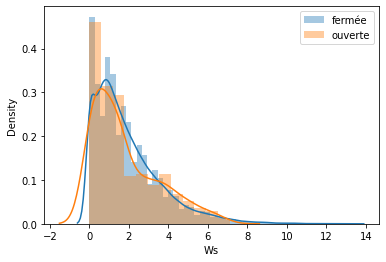

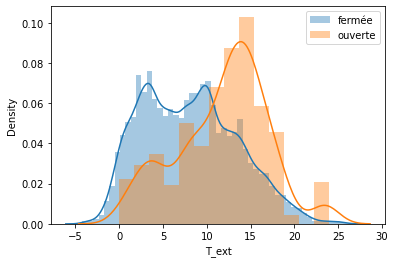

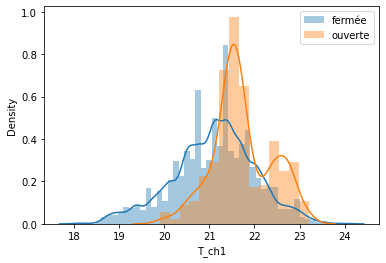

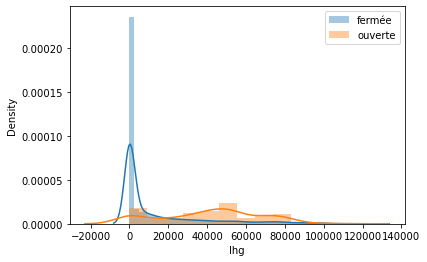

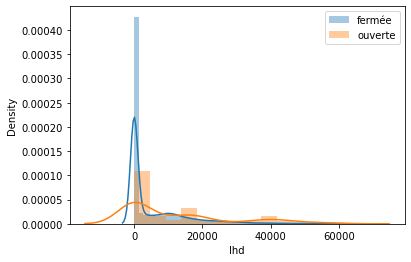

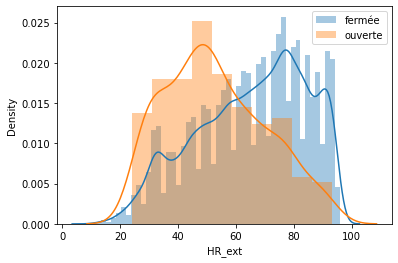

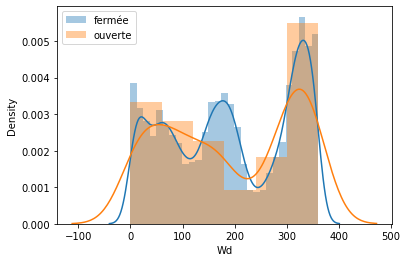

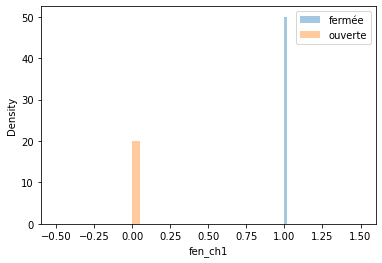

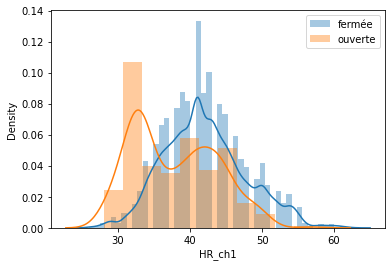

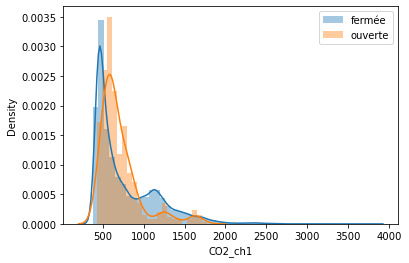

In [19]:
for col in df1.select_dtypes('float'):
    plt.figure()
    sns.distplot(f1_df[col],label='fermée')
    sns.distplot(o1_df[col],label='ouverte')
    #plt.title('Camp1N5')
    plt.legend()
for col in df1.select_dtypes('int'):
    plt.figure()
    sns.distplot(f1_df[col],label='fermée')
    sns.distplot(o1_df[col],label='ouverte')
    #plt.title('Camp1N5')
    plt.legend()

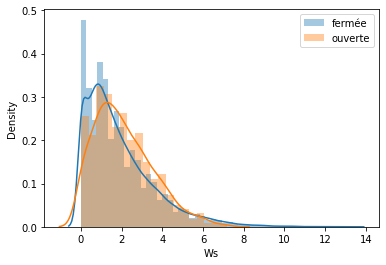

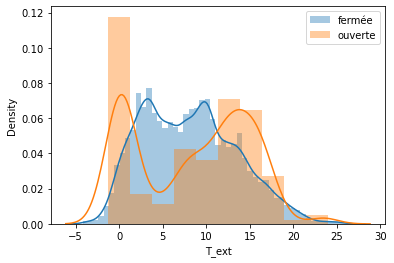

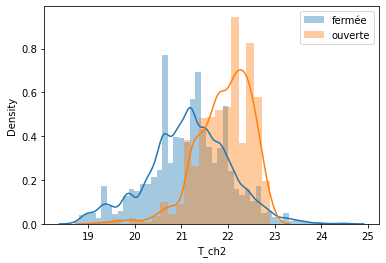

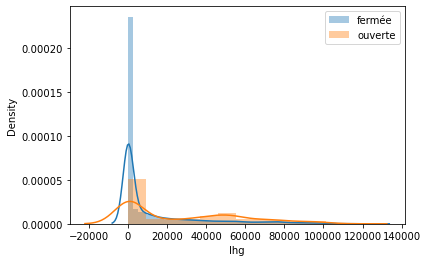

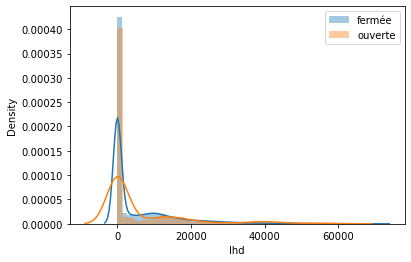

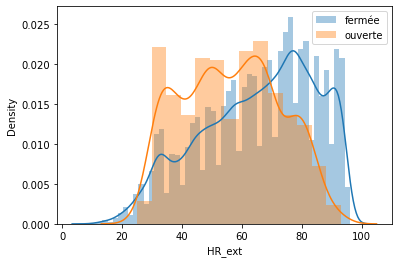

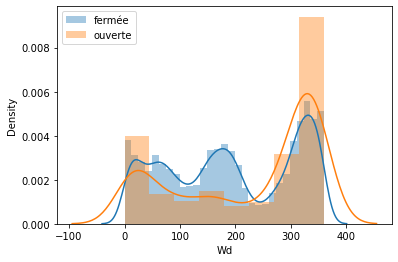

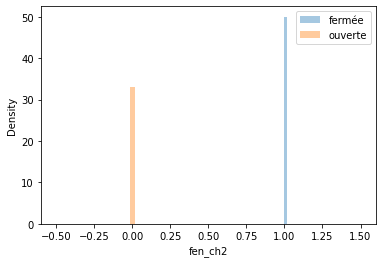

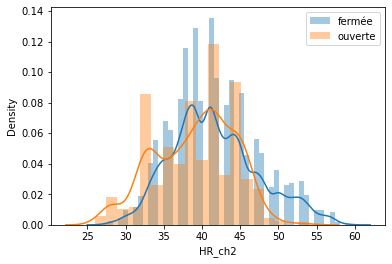

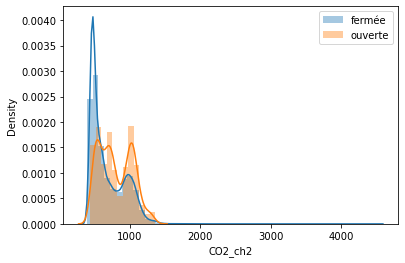

In [20]:
for col in df2.select_dtypes('float'):
    plt.figure()
    sns.distplot(f2_df[col],label='fermée')
    sns.distplot(o2_df[col],label='ouverte')
    #plt.title('Camp1N5')
    plt.legend()
for col in df2.select_dtypes('int'):
    plt.figure()
    sns.distplot(f2_df[col],label='fermée')
    sns.distplot(o2_df[col],label='ouverte')
    #plt.title('Camp1N5')
    plt.legend()

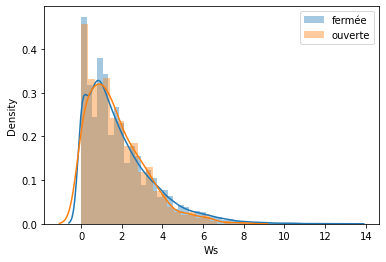

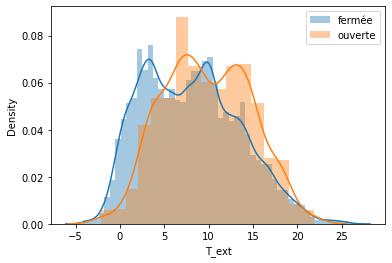

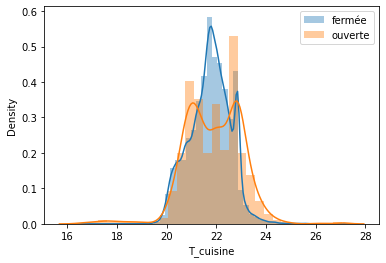

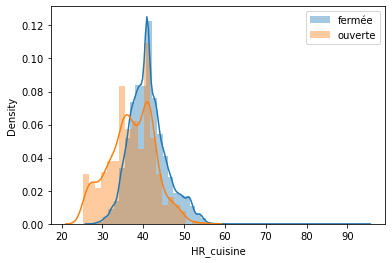

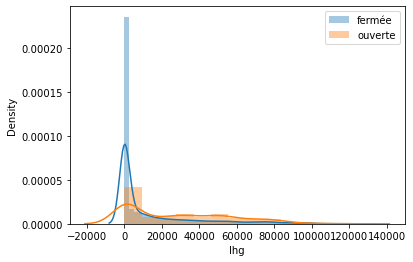

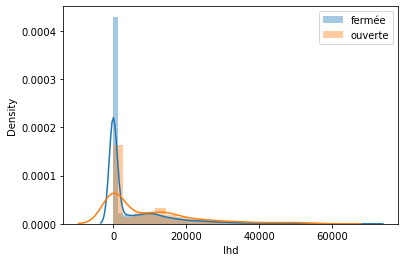

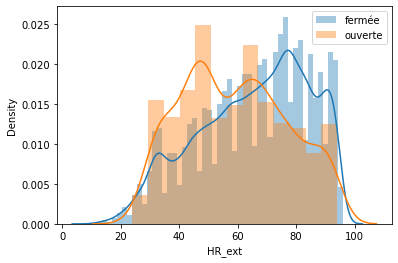

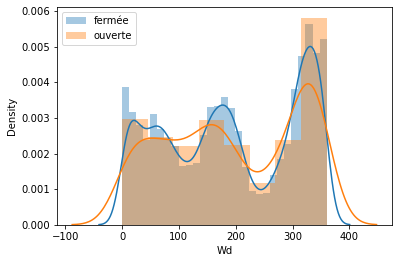

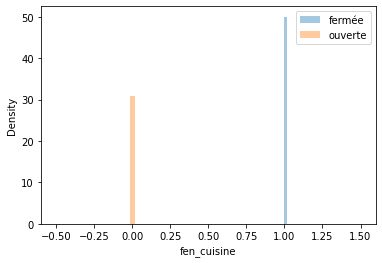

In [21]:
for col in dfc.select_dtypes('float'):
    plt.figure()
    sns.distplot(fc_df[col],label='fermée')
    sns.distplot(oc_df[col],label='ouverte')
    #plt.title('Camp1N5')
    plt.legend()
for col in dfc.select_dtypes('int'):
    plt.figure()
    sns.distplot(fc_df[col],label='fermée')
    sns.distplot(oc_df[col],label='ouverte')
    #plt.title('Camp1N5')
    plt.legend()

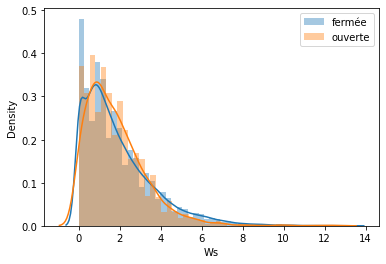

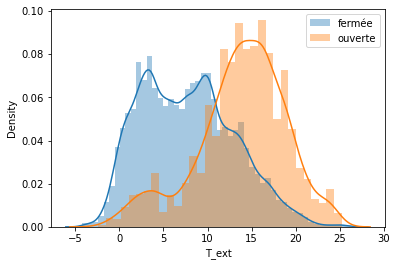

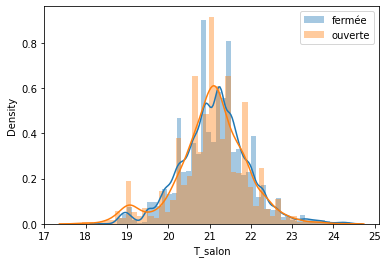

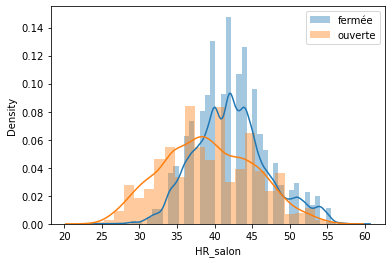

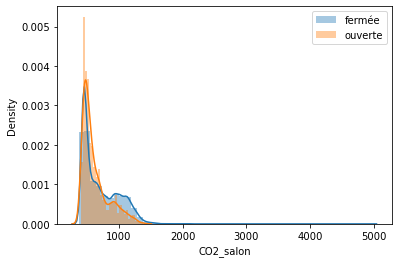

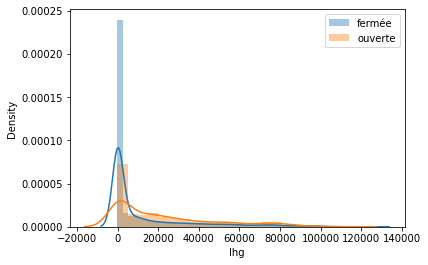

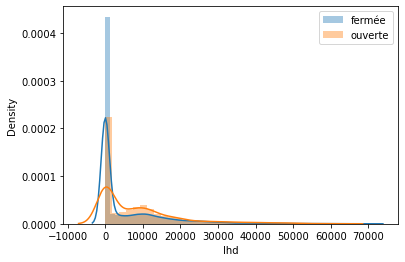

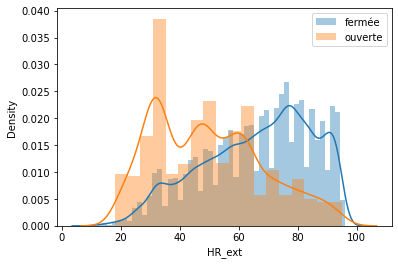

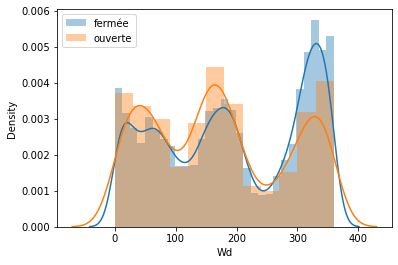

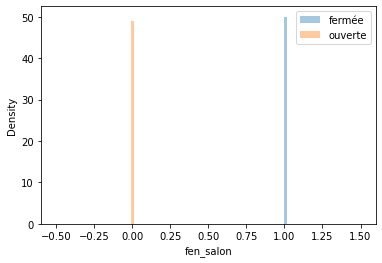

In [22]:
for col in dfs.select_dtypes('float'):
    plt.figure()
    sns.distplot(fs_df[col],label='fermée')
    sns.distplot(os_df[col],label='ouverte')
    #plt.title('Camp1N5')
    
    plt.legend()
for col in dfs.select_dtypes('int'):
    plt.figure()
    sns.distplot(fs_df[col],label='fermée')
    sns.distplot(os_df[col],label='ouverte')
    #plt.title('Camp1N5')
    plt.legend()

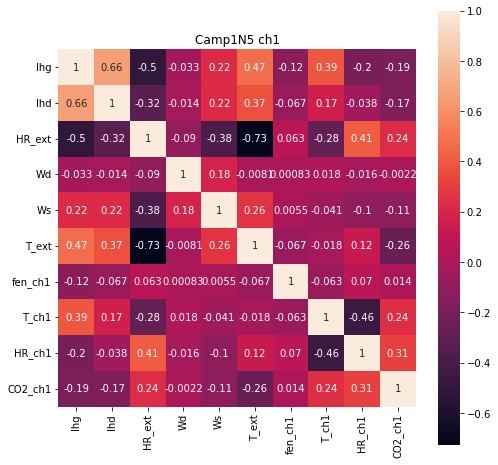

In [33]:
plt.subplots(figsize=(8,8))
sns.heatmap(df1.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Camp1N5 ch1')
plt.show()

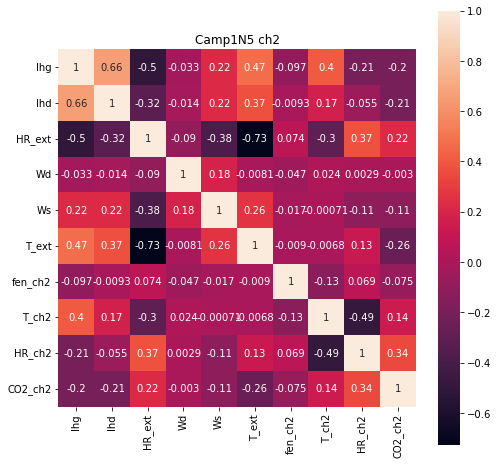

In [34]:
plt.subplots(figsize=(8,8))
sns.heatmap(df2.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Camp1N5 ch2')
plt.show()

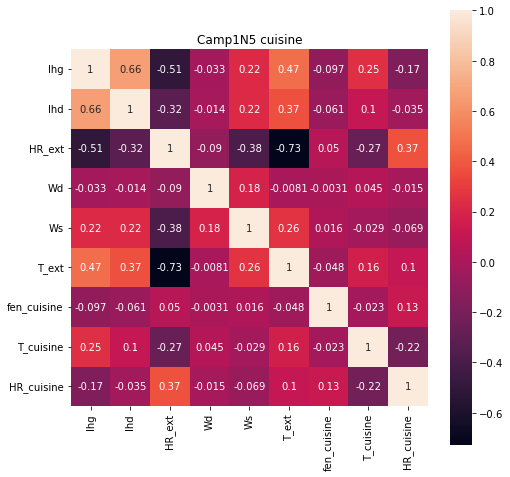

In [35]:
plt.subplots(figsize=(8,8))
sns.heatmap(dfc.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Camp1N5 cuisine')
plt.show()

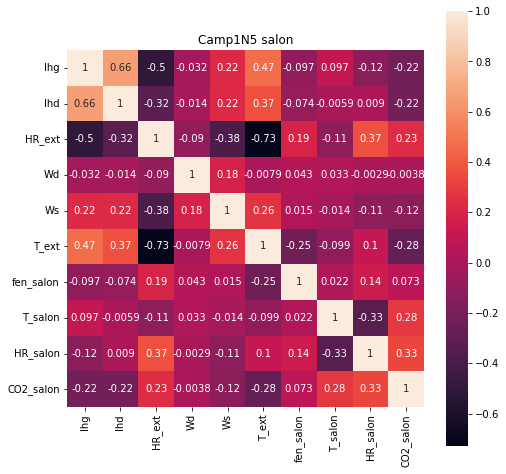

In [36]:
plt.subplots(figsize=(8,8))
sns.heatmap(dfs.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('Camp1N5 salon')
plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

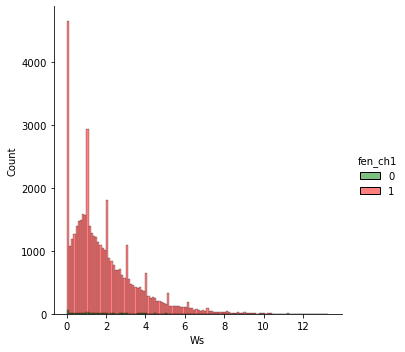

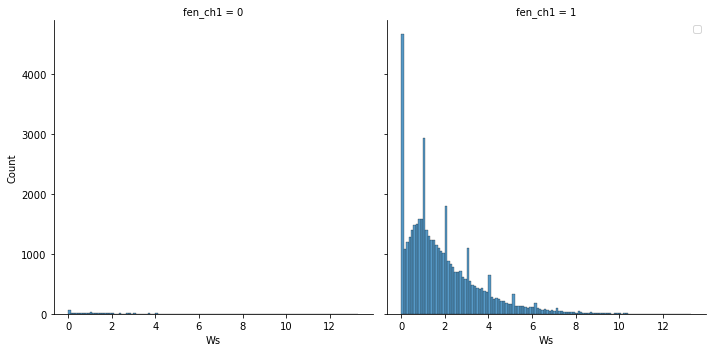

<Figure size 432x288 with 0 Axes>

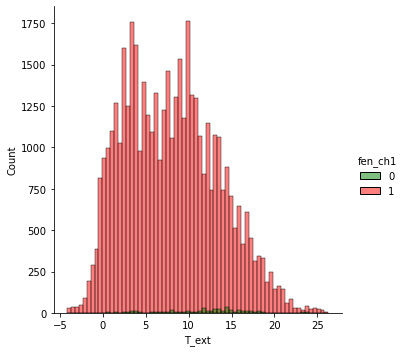

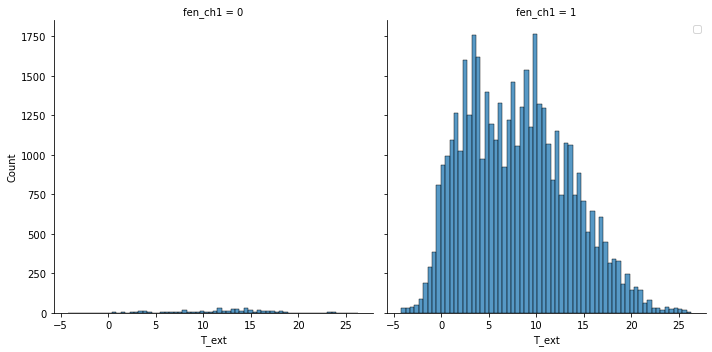

<Figure size 432x288 with 0 Axes>

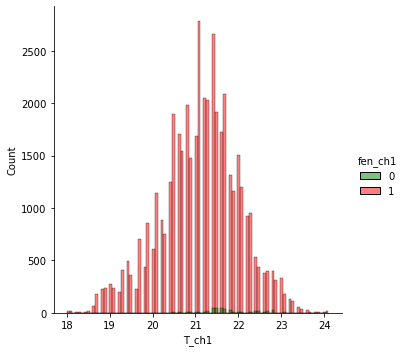

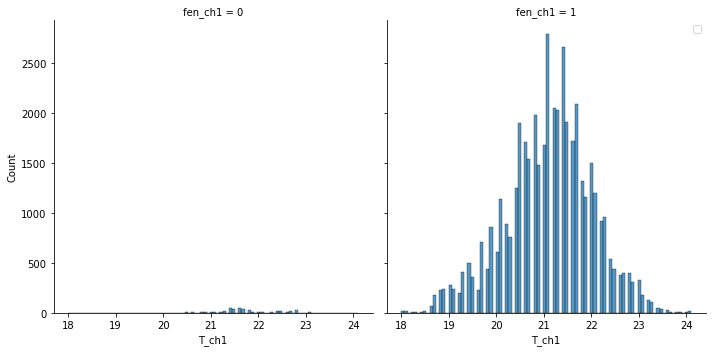

<Figure size 432x288 with 0 Axes>

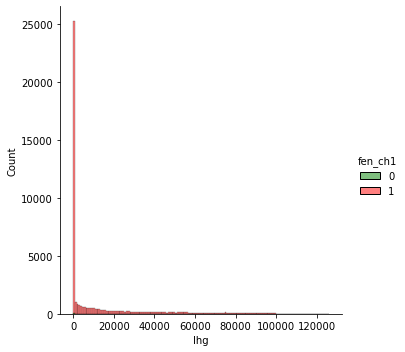

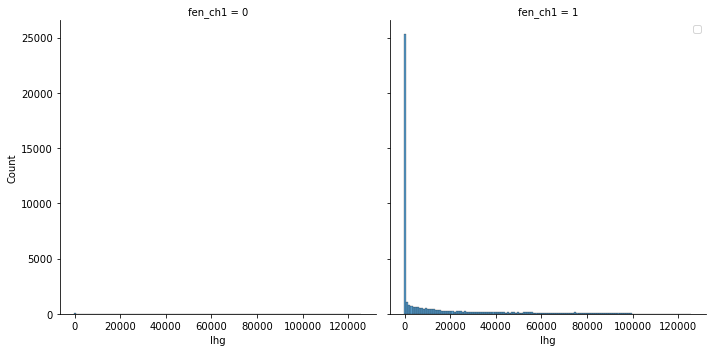

<Figure size 432x288 with 0 Axes>

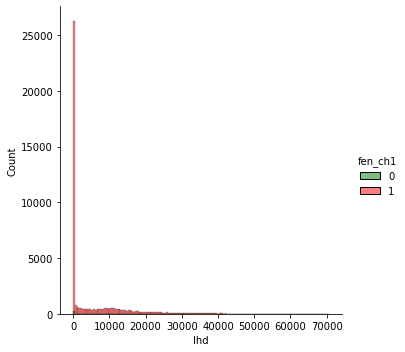

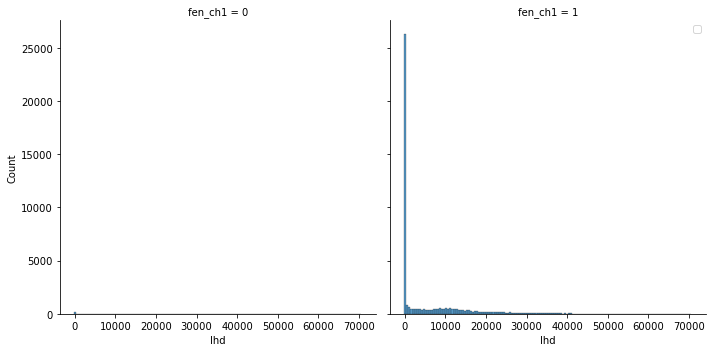

<Figure size 432x288 with 0 Axes>

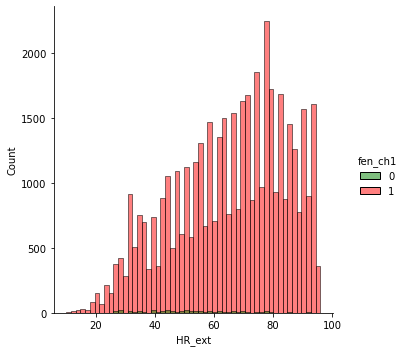

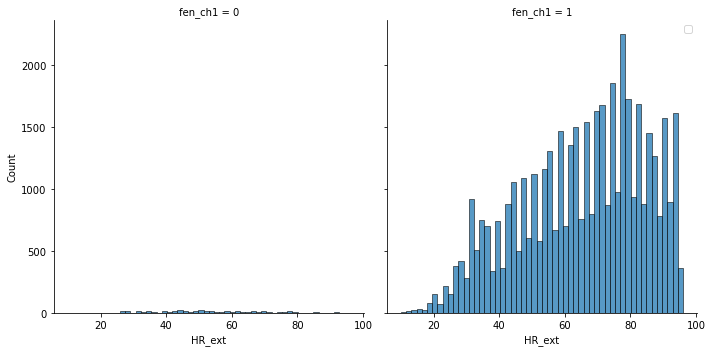

<Figure size 432x288 with 0 Axes>

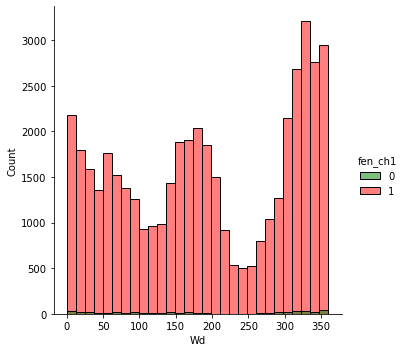

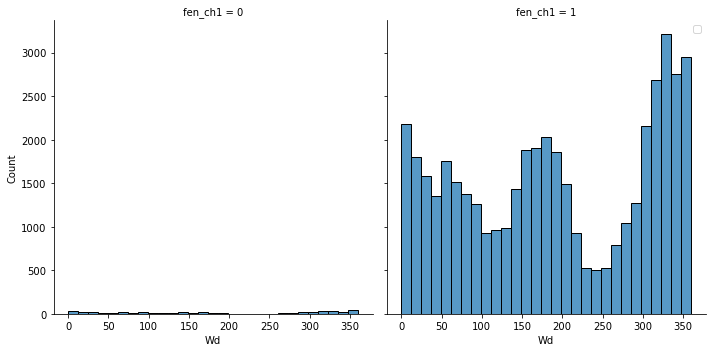

<Figure size 432x288 with 0 Axes>

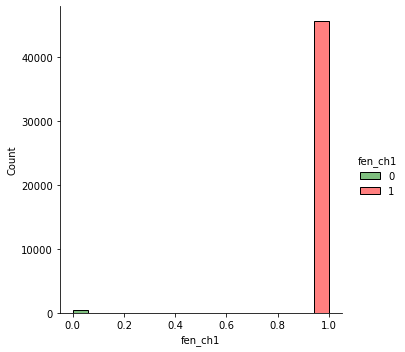

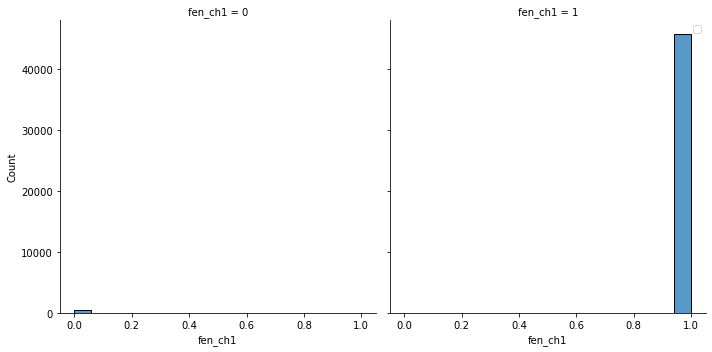

<Figure size 432x288 with 0 Axes>

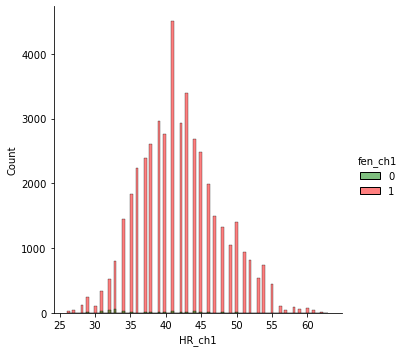

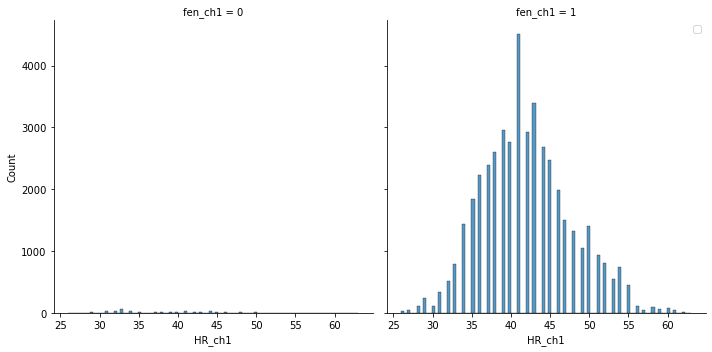

<Figure size 432x288 with 0 Axes>

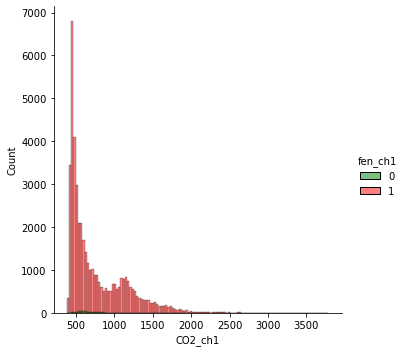

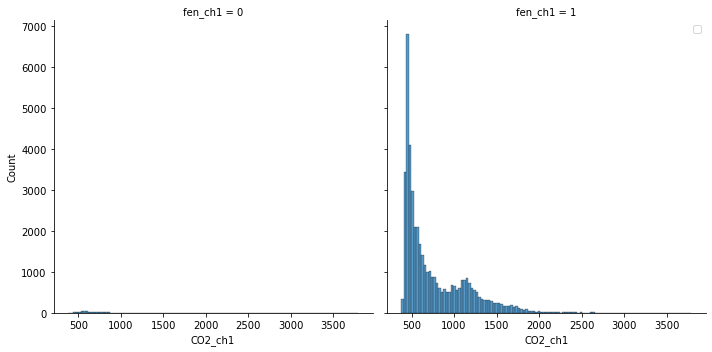

In [37]:
for col in df1.select_dtypes('float'):
    plt.figure()
    sns.displot(data=df1,x=col,hue="fen_ch1",palette=["g","r"])
    sns.displot(data=df1,x=col,col="fen_ch1",palette=["g","r"])
    plt.legend()
for col in df1.select_dtypes('int'):
    plt.figure()
    sns.displot(data=df1,x=col,hue="fen_ch1",palette=["g","r"])
    sns.displot(data=df1,x=col,col="fen_ch1",palette=["g","r"])
    plt.legend()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

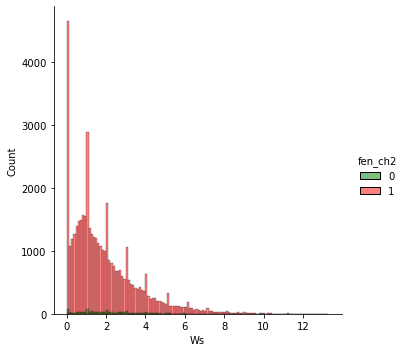

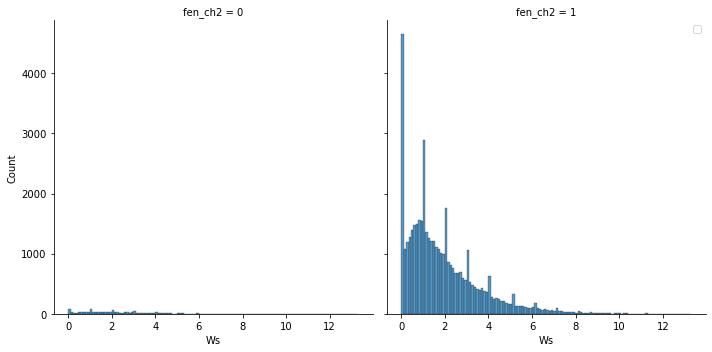

<Figure size 432x288 with 0 Axes>

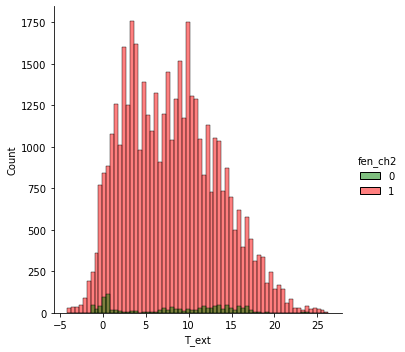

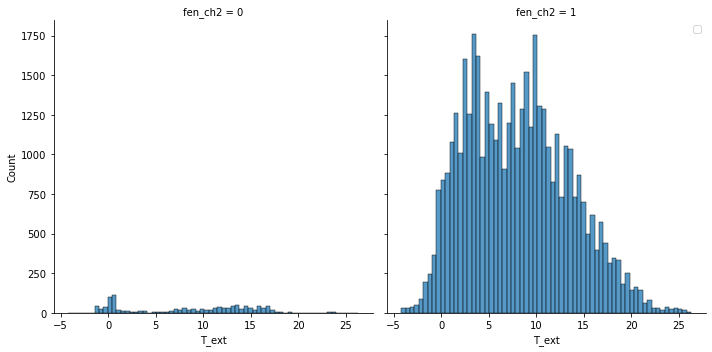

<Figure size 432x288 with 0 Axes>

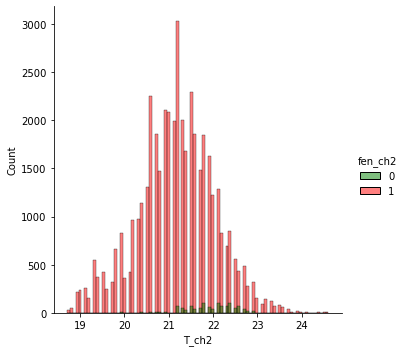

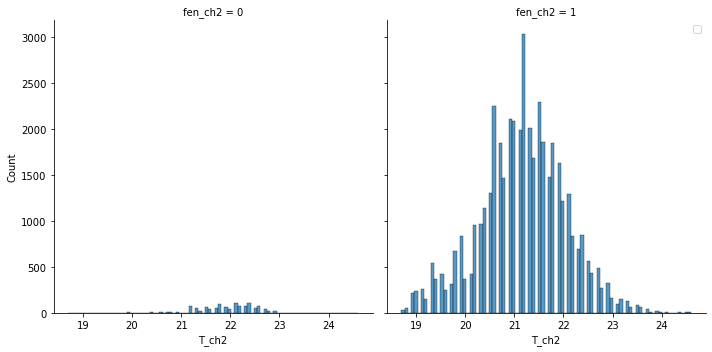

<Figure size 432x288 with 0 Axes>

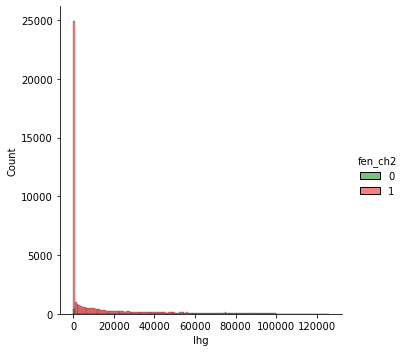

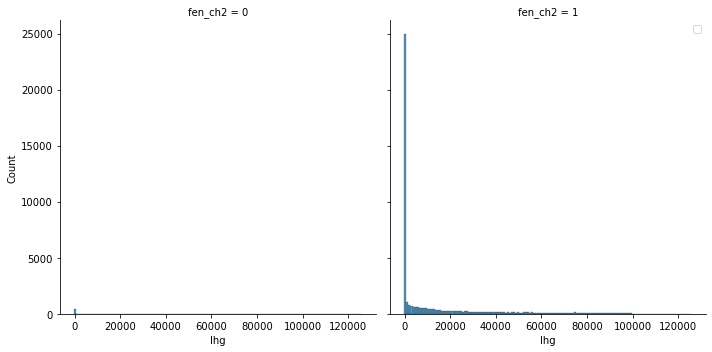

<Figure size 432x288 with 0 Axes>

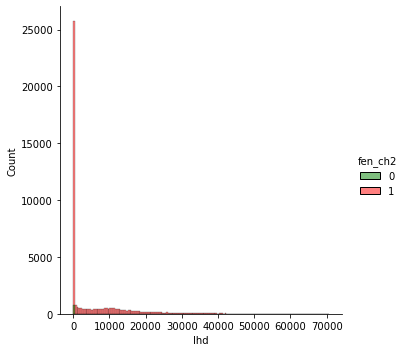

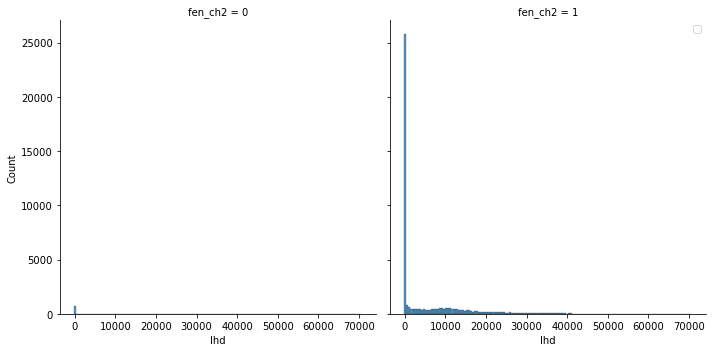

<Figure size 432x288 with 0 Axes>

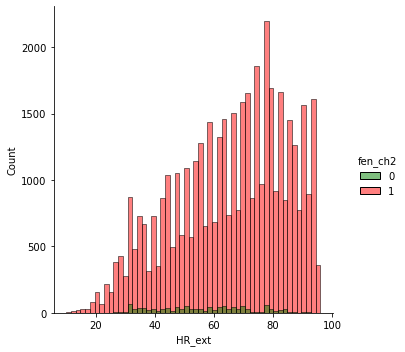

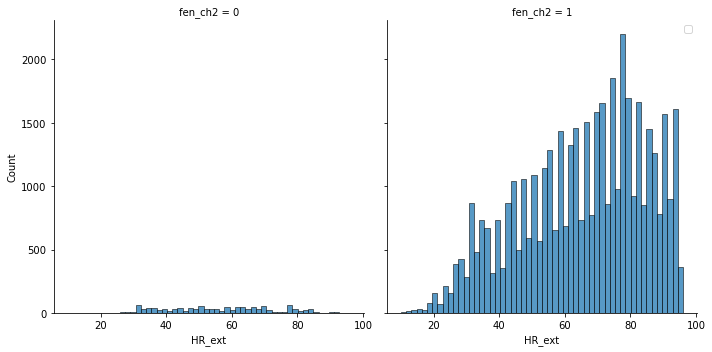

<Figure size 432x288 with 0 Axes>

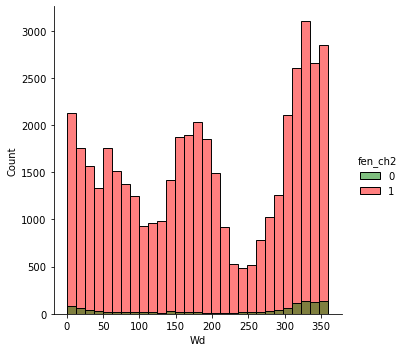

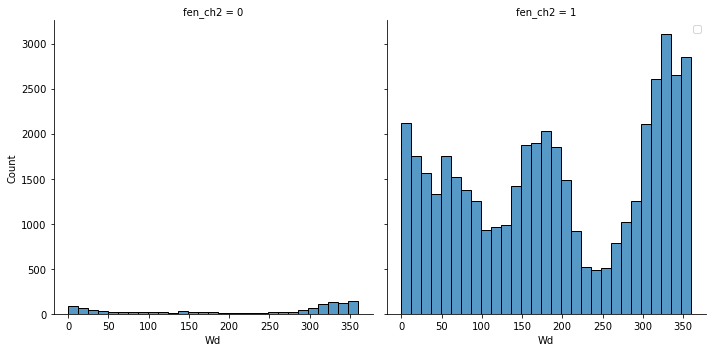

<Figure size 432x288 with 0 Axes>

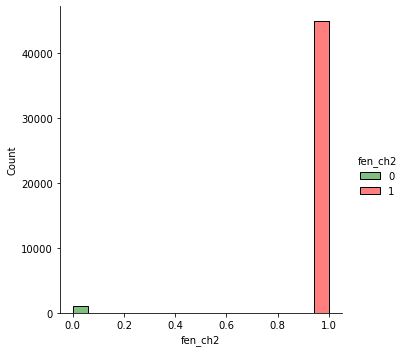

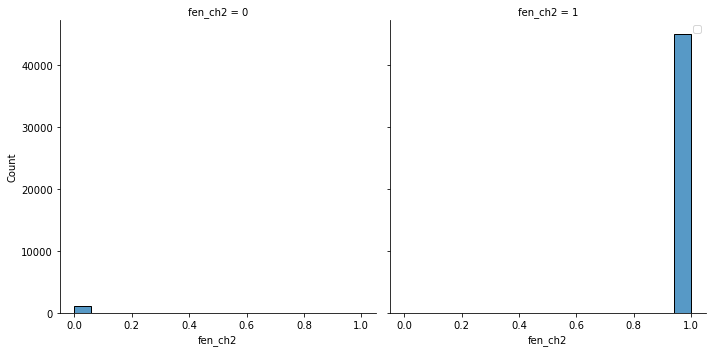

<Figure size 432x288 with 0 Axes>

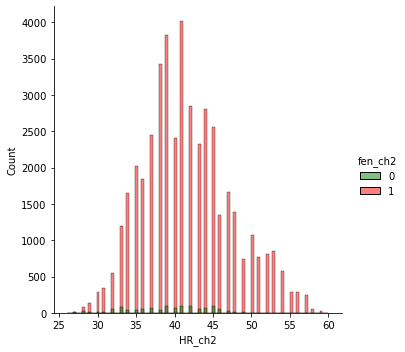

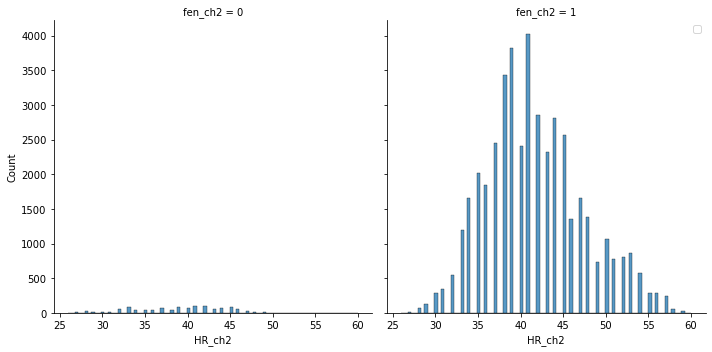

<Figure size 432x288 with 0 Axes>

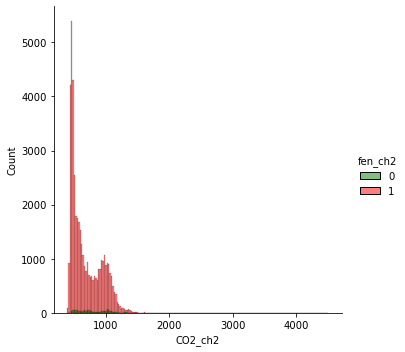

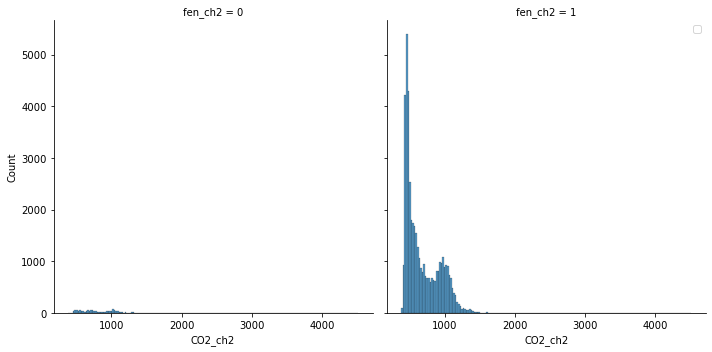

In [38]:
for col in df2.select_dtypes('float'):
    plt.figure()
    sns.displot(data=df2,x=col,hue="fen_ch2",palette=["g","r"])
    sns.displot(data=df2,x=col,col="fen_ch2",palette=["g","r"])
    plt.legend()
for col in df2.select_dtypes('int'):
    plt.figure()
    sns.displot(data=df2,x=col,hue="fen_ch2",palette=["g","r"])
    sns.displot(data=df2,x=col,col="fen_ch2",palette=["g","r"])
    plt.legend()    

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

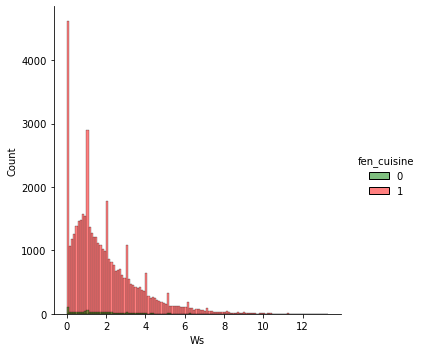

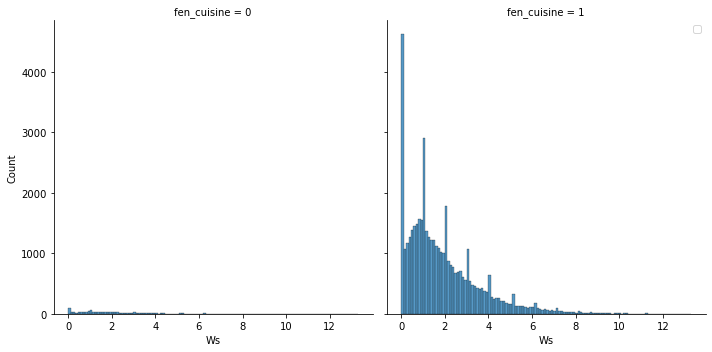

<Figure size 432x288 with 0 Axes>

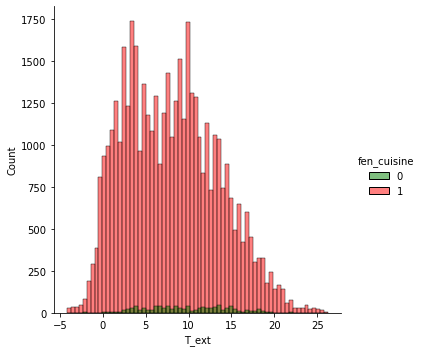

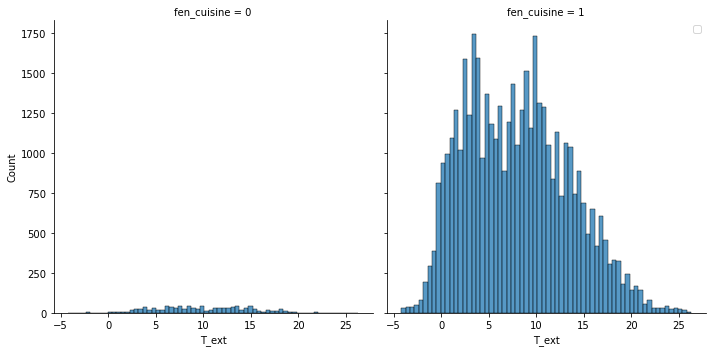

<Figure size 432x288 with 0 Axes>

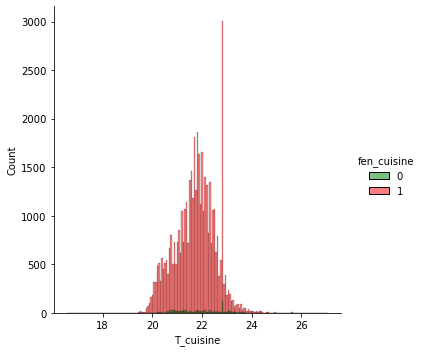

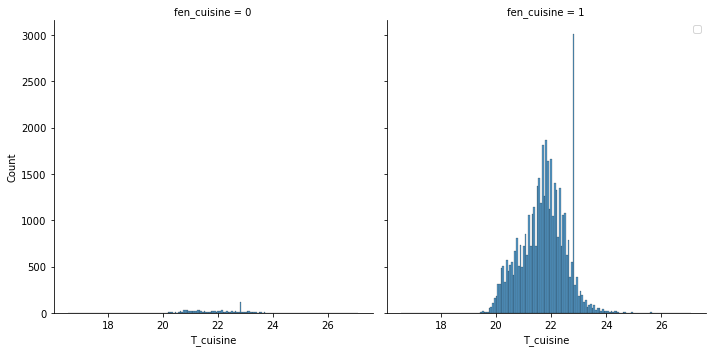

<Figure size 432x288 with 0 Axes>

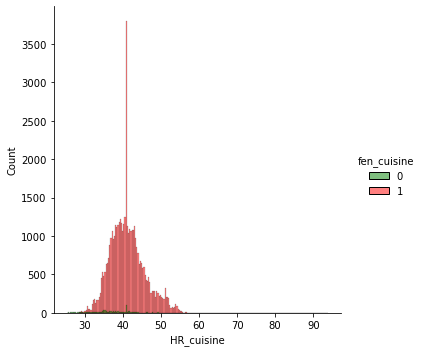

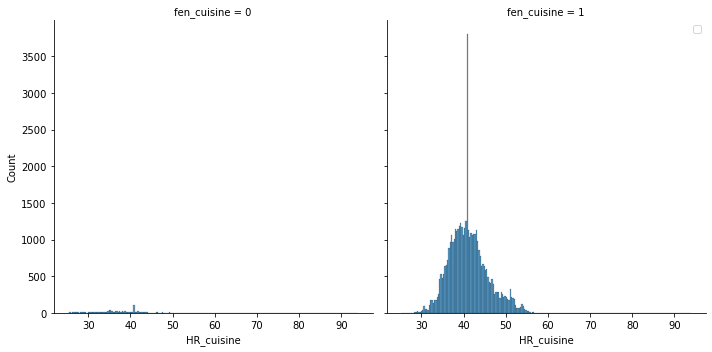

<Figure size 432x288 with 0 Axes>

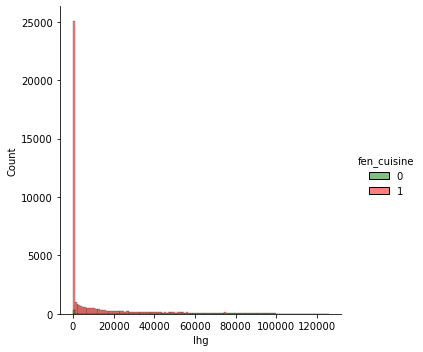

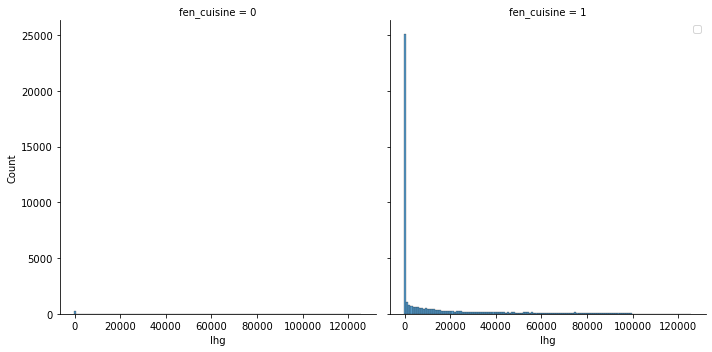

<Figure size 432x288 with 0 Axes>

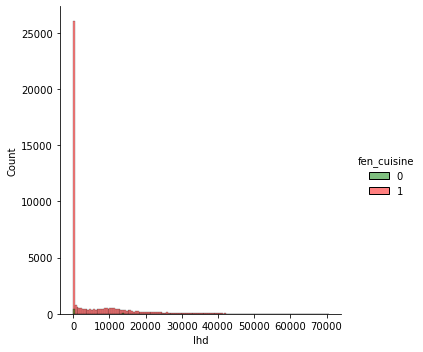

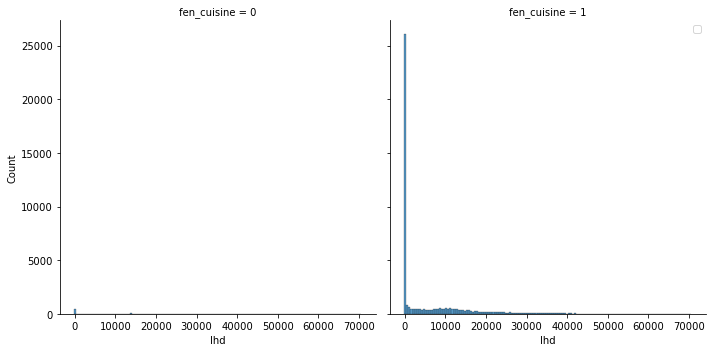

<Figure size 432x288 with 0 Axes>

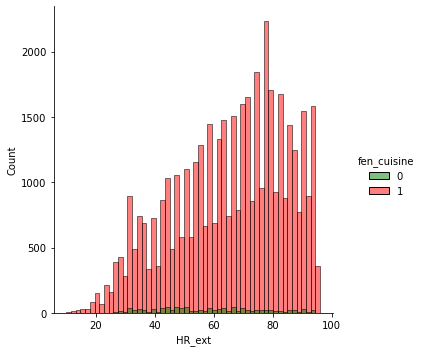

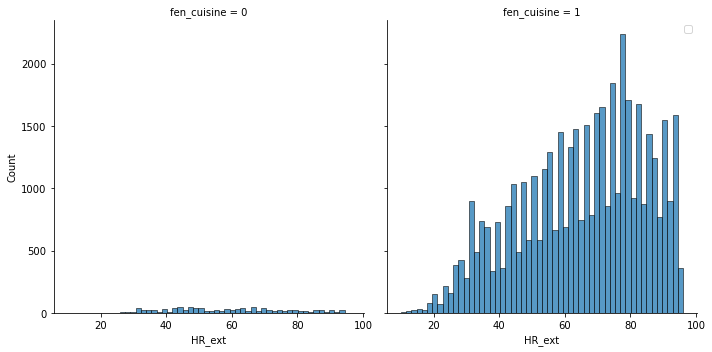

<Figure size 432x288 with 0 Axes>

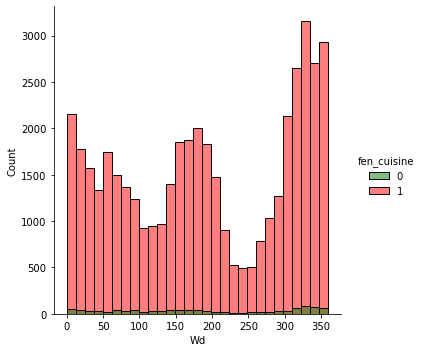

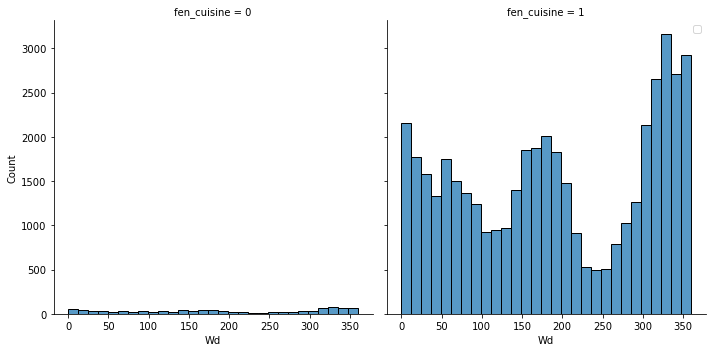

<Figure size 432x288 with 0 Axes>

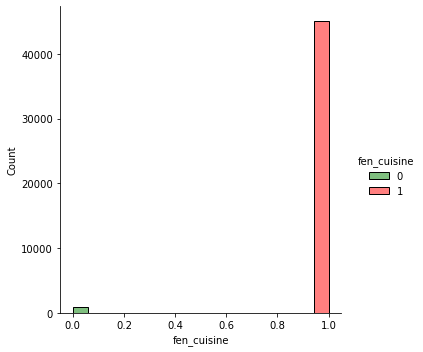

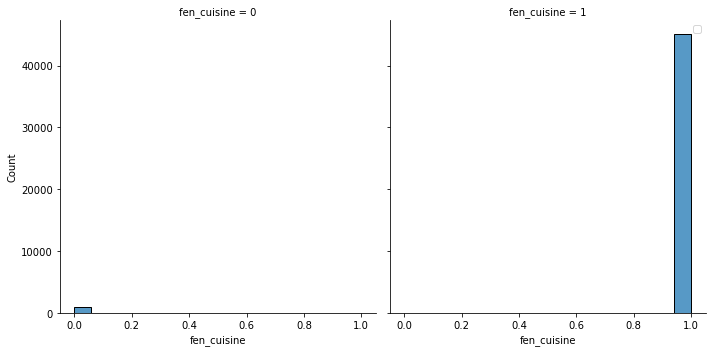

In [39]:
for col in dfc.select_dtypes('float'):
    plt.figure()
    sns.displot(data=dfc,x=col,hue="fen_cuisine",palette=["g","r"])
    sns.displot(data=dfc,x=col,col="fen_cuisine",palette=["g","r"])
    plt.legend()
for col in dfc.select_dtypes('int'):
    plt.figure()
    sns.displot(data=dfc,x=col,hue="fen_cuisine",palette=["g","r"])
    sns.displot(data=dfc,x=col,col="fen_cuisine",palette=["g","r"])
    plt.legend()

In [ ]:
for col in dfs.select_dtypes('float'):
    plt.figure()
    sns.displot(data=dfs,x=col,hue="fen_salon",palette=["g","r"])
    sns.displot(data=dfs,x=col,col="fen_salon",palette=["g","r"])
    plt.legend()
for col in dfs.select_dtypes('int'):
    plt.figure()
    sns.displot(data=dfs,x=col,hue="fen_salon",palette=["g","r"])
    sns.displot(data=dfs,x=col,col="fen_salon",palette=["g","r"])
    plt.legend()    
    

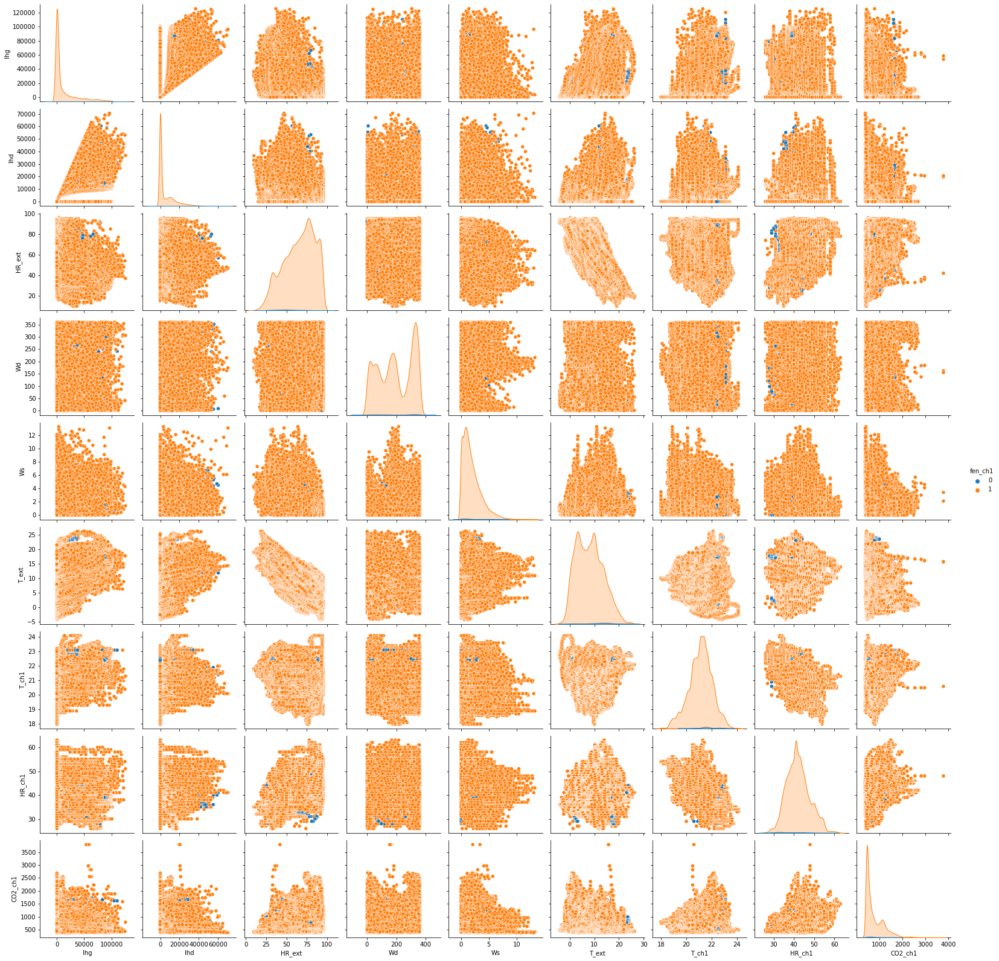

In [41]:
#CHAMBRE 1 
sns.pairplot(df1, hue="fen_ch1")

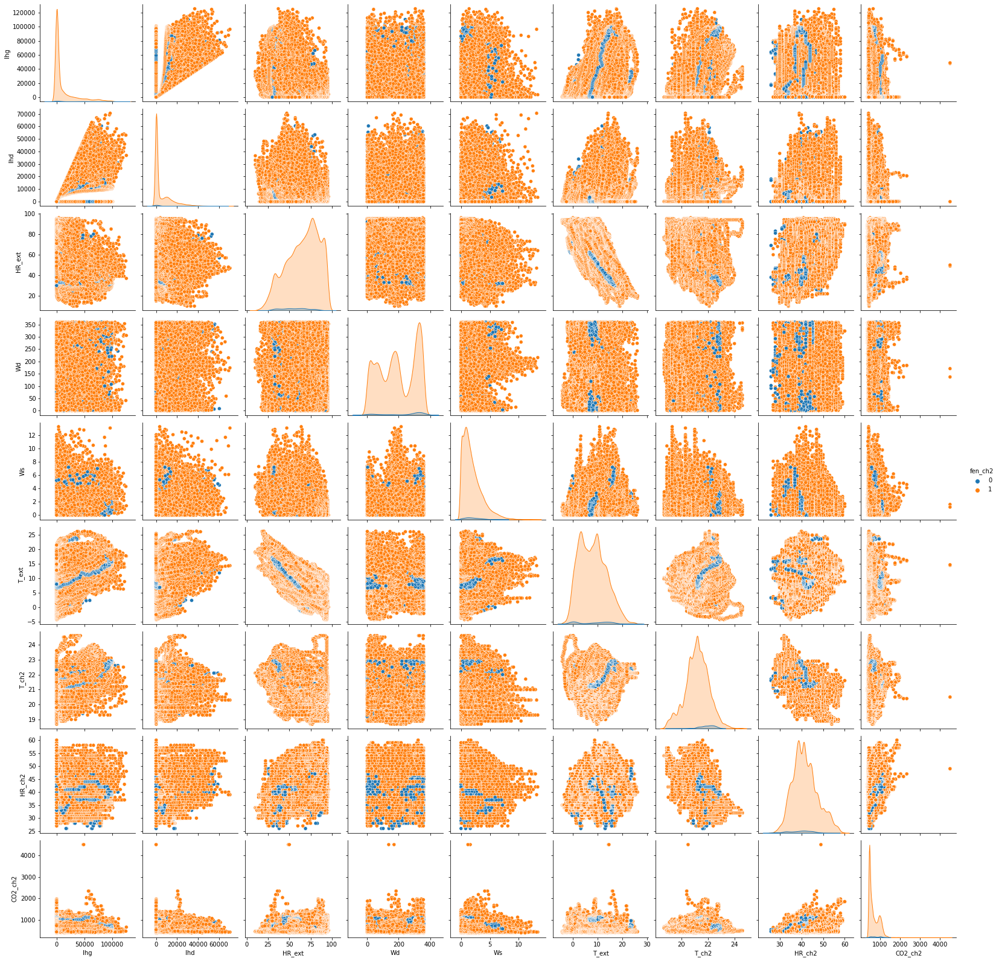

In [42]:
#CHAMBRE 2
sns.pairplot(df2, hue="fen_ch2")

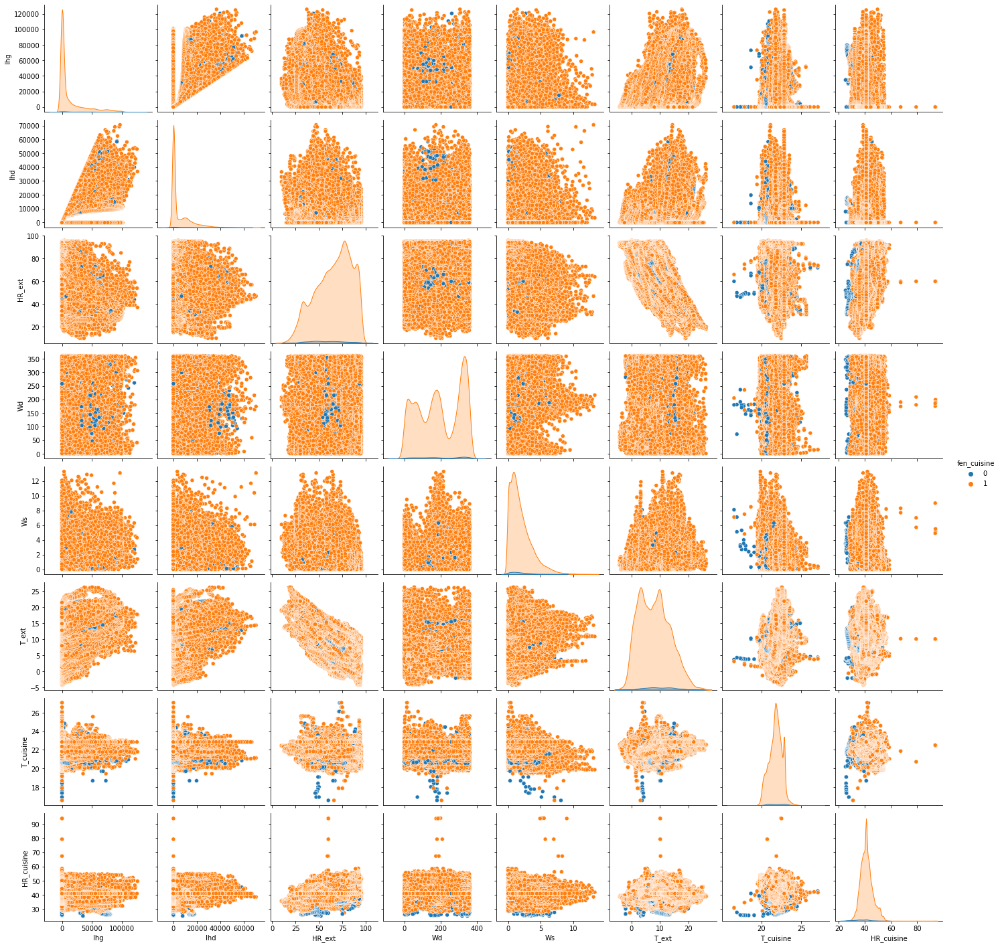

In [43]:
#cuisine
sns.pairplot(dfc, hue="fen_cuisine")

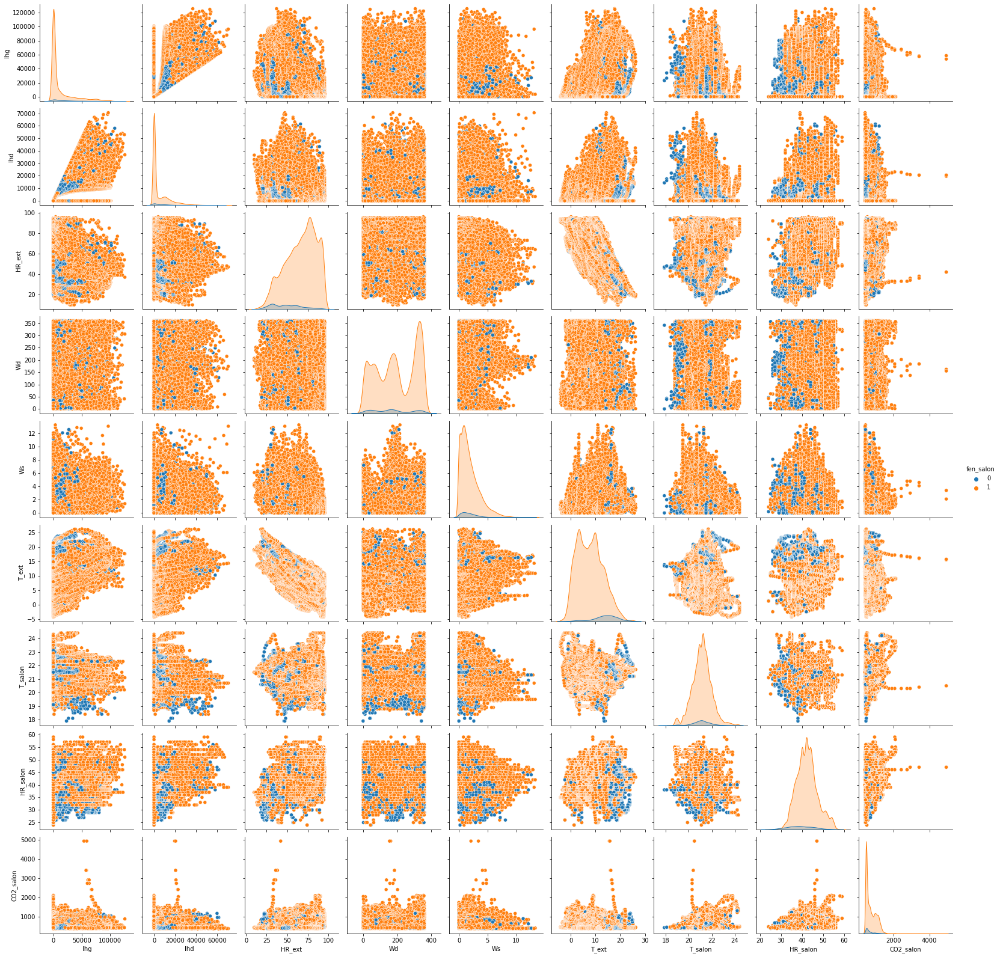

In [44]:
#salon
sns.pairplot(dfs, hue="fen_salon")

In [9]:
import dtale
dftn5=dtale.show(df)
dftn5

# Regroupé tout les données

In [139]:
dft=pd.concat([df,meteo1],axis=1)
dft.dropna(axis = 0, how = 'any',inplace=True)

In [140]:
t=dft.copy()
#dft.to_excel('Quivogne Q1_N4_Regroupé.xlsx')

In [141]:
dft.groupby(['fen_ch1','fen_ch2','fen_cuisine','fen_salon']).count()

T_ch1  HR_ch1  CO2_ch1  T_ch2  HR_ch2  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                          
0.0     0.0     0.0         1.0           23      23       23     23      23   
                1.0         0.0           42      42       42     42      42   
                            1.0          206     206      206    206     206   
        1.0     0.0         0.0           12      12       12     12      12   
                            1.0           14      14       14     14      14   
                1.0         0.0           20      20       20     20      20   
                            1.0          102     102      102    102     102   
1.0     0.0     0.0         0.0           27      27       27     27      27   
                            1.0           75      75       75     75      75   
                1.0         0.0           95      95       95     95      95   
                            1.0          664     664      664    664     664   
        1.0     0.0         0.0          130     130      130    130     130   
                            1.0          705     705      705    705     705   
                1.0         0.0         2092    2092     2092   2092    2092   
                            1.0        41852   41852    41852  41852   41852   

                                       CO2_ch2  T_cuisine  HR_cuisine  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                   
0.0     0.0     0.0         1.0             23         23          23   
                1.0         0.0             42         42          42   
                            1.0            206        206         206   
        1.0     0.0         0.0             12         12          12   
                            1.0             14         14          14   
                1.0         0.0             20         20          20   
                            1.0            102        102         102   
1.0     0.0     0.0         0.0             27         27          27   
                            1.0             75         75          75   
                1.0         0.0             95         95          95   
                            1.0            664        664         664   
        1.0     0.0         0.0            130        130         130   
                            1.0            705        705         705   
                1.0         0.0           2092       2092        2092   
                            1.0          41852      41852       41852   

                                       T_salon  HR_salon  CO2_salon    Ihg  \
fen_ch1 fen_ch2 fen_cuisine fen_salon                                        
0.0     0.0     0.0         1.0             23        23         23     23   
                1.0         0.0             42        42         42     42   
                            1.0            206       206        206    206   
        1.0     0.0         0.0             12        12         12     12   
                            1.0             14        14         14     14   
                1.0         0.0             20        20         20     20   
                            1.0            102       102        102    102   
1.0     0.0     0.0         0.0             27        27         27     27   
                            1.0             75        75         75     75   
                1.0         0.0             95        95         95     95   
                            1.0            664       664        664    664   
        1.0     0.0         0.0            130       130        130    130   
                            1.0            705       705        705    705   
                1.0         0.0           2092      2092       2092   2092   
                            1.0          41852     41852      41852  41852   

                                         Ihd  HR_ext     Wd     Ws  T_ext  
fen_ch1 fen_ch2 fen_cuisine fen_s

In [142]:
t['heure']=t.index.hour
t['jour']=t.index.weekday


In [143]:
t

,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_cuisine,T_cuisine,...,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,heure,jour
Date,,,,,,,,,,,,,,,,,,,,,
2018-12-13 17:20:00,1.0,20.6,38.0,944.0,0.0,20.4,40.0,907.0,1.0,20.126,...,42.0,1020.0,15,15,83,337,1.4,-1.3,17,3
2018-12-13 17:25:00,1.0,20.6,38.0,944.0,1.0,20.4,40.0,907.0,1.0,20.126,...,42.0,1020.0,15,15,82,37,2.3,-1.3,17,3
2018-12-13 17:30:00,1.0,21.1,39.0,1144.0,1.0,21.0,40.0,987.0,1.0,22.250,...,41.0,1139.0,0,0,83,359,1.2,-1.3,17,3
2018-12-13 17:35:00,1.0,21.1,39.0,1144.0,1.0,21.0,40.0,987.0,1.0,22.250,...,41.0,1139.0,0,0,83,14,1.9,-1.3,17,3
2018-12-13 17:40:00,1.0,21.5,39.0,1178.0,1.0,21.4,39.0,1053.0,1.0,22.417,...,41.0,1182.0,0,0,83,6,2.3,-1.1,17,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-22 16:10:00,1.0,22.1,46.0,981.0,1.0,22.3,49.0,1083.0,1.0,22.848,...,53.0,1384.0,64910,12574,30,27,4.4,21.8,16,2
2019-05-22 16:15:00,1.0,22.1,46.0,981.0,1.0,22.3,49.0,1083.0,1.0,22.848,...,53.0,1384.0,63490,12676,30,326,3.0,21.9,16,2
2019-05-22 16:20:00,1.0,22.1,46.0,951.0,1.0,22.3,48.0,957.0,1.0,22.848,...,52.0,1387.0,60400,13141,30,10,5.8,21.8,16,2


In [144]:
#afficher les dates pour chaque cas 
z=dft.groupby(['fen_ch1','fen_ch2','fen_cuisine','fen_salon']).groups
import pprint as pprint
pprint.pprint(z)

{(0.0, 0.0, 0.0, 1.0): DatetimeIndex(['2019-02-14 09:45:00', '2019-02-14 09:50:00',
               '2019-02-14 09:55:00', '2019-02-14 10:00:00',
               '2019-02-14 10:05:00', '2019-02-14 10:10:00',
               '2019-02-14 10:15:00', '2019-02-14 12:55:00',
               '2019-02-24 14:10:00', '2019-04-26 12:10:00',
               '2019-04-26 12:15:00', '2019-04-26 12:20:00',
               '2019-04-26 12:25:00', '2019-04-26 12:30:00',
               '2019-04-26 12:35:00', '2019-04-26 12:40:00',
               '2019-04-26 12:45:00', '2019-05-16 14:25:00',
               '2019-05-16 14:30:00', '2019-05-16 14:35:00',
               '2019-05-16 14:40:00', '2019-05-16 14:45:00',
               '2019-05-16 14:50:00'],
              dtype='datetime64[ns]', name='Date', freq=None),
 (0.0, 0.0, 1.0, 0.0): DatetimeIndex(['2019-03-16 12:05:00', '2019-03-16 12:20:00',
               '2019-03-16 12:25:00', '2019-03-31 10:35:00',
               '2019-03-31 10:40:00', '2019-03-31 10:45:00'

In [145]:
liste_de_condition=[
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#1------0-0-0-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#2------0-0-0-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#3------0-0-1-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#4------0-0-1-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#5------0-1-0-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#6------0-1-0-1
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#7------0-1-1-0
    (dft['fen_ch1'] == 0)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#8------0-1-1-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#9------1-0-0-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#10-----1-0-0-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#11-----1-0-1-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==0)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1),#12-----1-0-1-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==0),#13-----1-1-0-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==0)&(dft['fen_salon']==1),#14-----1-1-0-1
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==0),#15-----1-1-1-0
    (dft['fen_ch1'] == 1)&(dft['fen_ch2']==1)&(dft['fen_cuisine']==1)&(dft['fen_salon']==1)]#16-----1-1-1-1
liste1=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16']    

dft['fenetre'] = np.select(liste_de_condition, liste1, default='Not Specified')
dft.drop(['fen_ch1','fen_ch2','fen_cuisine','fen_salon'],axis=1,inplace=True)
dft

,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fenetre
Date,,,,,,,,,,,,,,,,,,
2018-12-13 17:20:00,20.6,38.0,944.0,20.4,40.0,907.0,20.126,36.898,21.0,42.0,1020.0,15,15,83,337,1.4,-1.3,12
2018-12-13 17:25:00,20.6,38.0,944.0,20.4,40.0,907.0,20.126,36.898,21.0,42.0,1020.0,15,15,82,37,2.3,-1.3,16
2018-12-13 17:30:00,21.1,39.0,1144.0,21.0,40.0,987.0,22.250,38.521,21.3,41.0,1139.0,0,0,83,359,1.2,-1.3,16
2018-12-13 17:35:00,21.1,39.0,1144.0,21.0,40.0,987.0,22.250,38.521,21.3,41.0,1139.0,0,0,83,14,1.9,-1.3,16
2018-12-13 17:40:00,21.5,39.0,1178.0,21.4,39.0,1053.0,22.417,39.259,21.5,41.0,1182.0,0,0,83,6,2.3,-1.1,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-22 16:10:00,22.1,46.0,981.0,22.3,49.0,1083.0,22.848,40.968,21.6,53.0,1384.0,64910,12574,30,27,4.4,21.8,16
2019-05-22 16:15:00,22.1,46.0,981.0,22.3,49.0,1083.0,22.848,40.968,21.6,53.0,1384.0,63490,12676,30,326,3.0,21.9,16
2019-05-22 16:20:00,22.1,46.0,951.0,22.3,48.0,957.0,22.848,40.968,21.6,52.0,1387.0,60400,13141,30,10,5.8,21.8,16


In [146]:
c=dft.copy()
c

,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fenetre
Date,,,,,,,,,,,,,,,,,,
2018-12-13 17:20:00,20.6,38.0,944.0,20.4,40.0,907.0,20.126,36.898,21.0,42.0,1020.0,15,15,83,337,1.4,-1.3,12
2018-12-13 17:25:00,20.6,38.0,944.0,20.4,40.0,907.0,20.126,36.898,21.0,42.0,1020.0,15,15,82,37,2.3,-1.3,16
2018-12-13 17:30:00,21.1,39.0,1144.0,21.0,40.0,987.0,22.250,38.521,21.3,41.0,1139.0,0,0,83,359,1.2,-1.3,16
2018-12-13 17:35:00,21.1,39.0,1144.0,21.0,40.0,987.0,22.250,38.521,21.3,41.0,1139.0,0,0,83,14,1.9,-1.3,16
2018-12-13 17:40:00,21.5,39.0,1178.0,21.4,39.0,1053.0,22.417,39.259,21.5,41.0,1182.0,0,0,83,6,2.3,-1.1,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-22 16:10:00,22.1,46.0,981.0,22.3,49.0,1083.0,22.848,40.968,21.6,53.0,1384.0,64910,12574,30,27,4.4,21.8,16
2019-05-22 16:15:00,22.1,46.0,981.0,22.3,49.0,1083.0,22.848,40.968,21.6,53.0,1384.0,63490,12676,30,326,3.0,21.9,16
2019-05-22 16:20:00,22.1,46.0,951.0,22.3,48.0,957.0,22.848,40.968,21.6,52.0,1387.0,60400,13141,30,10,5.8,21.8,16


In [147]:
c['heure']=c.index.hour
c['jour']=c.index.weekday
c['mois']=c.index.month

In [148]:
c

,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,...,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,fenetre,heure,jour,mois
Date,,,,,,,,,,,,,,,,,,,,,
2018-12-13 17:20:00,20.6,38.0,944.0,20.4,40.0,907.0,20.126,36.898,21.0,42.0,...,15,15,83,337,1.4,-1.3,12,17,3,12
2018-12-13 17:25:00,20.6,38.0,944.0,20.4,40.0,907.0,20.126,36.898,21.0,42.0,...,15,15,82,37,2.3,-1.3,16,17,3,12
2018-12-13 17:30:00,21.1,39.0,1144.0,21.0,40.0,987.0,22.250,38.521,21.3,41.0,...,0,0,83,359,1.2,-1.3,16,17,3,12
2018-12-13 17:35:00,21.1,39.0,1144.0,21.0,40.0,987.0,22.250,38.521,21.3,41.0,...,0,0,83,14,1.9,-1.3,16,17,3,12
2018-12-13 17:40:00,21.5,39.0,1178.0,21.4,39.0,1053.0,22.417,39.259,21.5,41.0,...,0,0,83,6,2.3,-1.1,16,17,3,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-22 16:10:00,22.1,46.0,981.0,22.3,49.0,1083.0,22.848,40.968,21.6,53.0,...,64910,12574,30,27,4.4,21.8,16,16,2,5
2019-05-22 16:15:00,22.1,46.0,981.0,22.3,49.0,1083.0,22.848,40.968,21.6,53.0,...,63490,12676,30,326,3.0,21.9,16,16,2,5
2019-05-22 16:20:00,22.1,46.0,951.0,22.3,48.0,957.0,22.848,40.968,21.6,52.0,...,60400,13141,30,10,5.8,21.8,16,16,2,5


In [149]:
f=pd.DataFrame(dft['fenetre'].value_counts())
f['valeur']=f.index
k=f['valeur'].to_numpy()
k=list(map(int, k))
liste=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
l=[]
for i in liste:
    for j in k:
        if(i==j):
            l.append(i)
l


[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]

In [150]:
f=pd.DataFrame(dft['fenetre'].value_counts())#transformer en data frame 
f.sort_values(by='fenetre',inplace=True,ascending=False)
f['état']=f.index
f.reset_index(inplace = True)
f['nombre de fois']=f['fenetre']
f['duré en minute']=f['nombre de fois']*5
f['duré en heure']=f['duré en minute']/60
f['état']=f['état'].astype(int)
#k=f['valeur'].to_numpy()
#k=list(map(int, k))
#liste=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
#l=[]
#for i in liste:
 #   for j in k:
    #    if(i==j):
     #       l.append(i)
#l
#f.sort_values(by='cas',inplace=True,ascending=True)
f.drop('fenetre',axis=1,inplace=True)
f.sort_values(by='état',inplace=True,ascending=True)
f.reset_index(inplace = True)
f.drop('level_0',axis=1,inplace=True)
f.drop('index',axis=1,inplace=True)
f.to_excel('Quivogne Q1_N5_Regroupé_stat.xlsx')

In [80]:
r=pd.DataFrame({"état" : [str(x + 1) for x in range(16)],
              "fen_ch1" : ["ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé","fermé","fermé","fermé","fermé"],
              "fen_ch2" : ["ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé","ouverte","ouverte","ouverte","ouverte","fermé","fermé","fermé","fermé"],
              "fen_cuisine" : ["ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé","ouverte","ouverte","fermé","fermé"],            
              "fen_salon":["ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé","ouverte","fermé"],
              #"période":["2019-03-05 14:25:00--2019-03-05 14:50:00","2019-03-05 14:05:00--2019-03-05 14:20:00","" ,"" ,"2019-02-23 13:25:00--2019-02-23 15:10:00 & 2019-04-09 19:40:00 & 2019-04-13 11:05:00 ","" ,"" ,"" ,"" , "","" ,"" ,"" ,"" ,"" ,""]
              #"Cas détectés sur nos données Q1 N2":[np.where(liste==l, '✔', 'X')],
              "Cas détectés sur nos données":["X","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔","✔"]
             })

r.to_excel('Quivogne Q1_N5_Regroupé_explication.xlsx')

In [25]:
r
#data = pd.concat([r, f],index=True ,axis=1)
#data = r.merge(f, how='left', left_index=True, right_index=True)
#data = data.loc[:,~data.columns.duplicated()]
#data


,état,fen_ch1,fen_ch2,fen_cuisine,fen_salon,Cas détectés sur nos données
0,1,ouverte,ouverte,ouverte,ouverte,X
1,2,ouverte,ouverte,ouverte,fermé,✔
2,3,ouverte,ouverte,fermé,ouverte,✔
3,4,ouverte,ouverte,fermé,fermé,✔
4,5,ouverte,fermé,ouverte,ouverte,✔
5,6,ouverte,fermé,ouverte,fermé,✔
6,7,ouverte,fermé,fermé,ouverte,✔
7,8,ouverte,fermé,fermé,fermé,✔
8,9,fermé,ouverte,ouverte,ouverte,✔
9,10,fermé,ouverte,ouverte,fermé,✔


In [151]:
c.dropna(axis = 0, how = 'any',inplace=True)
ytd = c['fenetre']
Xtd = c.drop(['fenetre'], axis=1)

In [152]:
#supprimé les valeurs manquantes 
dft.dropna(axis = 0, how = 'any',inplace=True)

In [153]:
#création variable/cible 
yt = dft['fenetre']
Xt = dft.drop(['fenetre'], axis=1)

In [154]:
Xt

,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd,Ws,T_ext
Date,,,,,,,,,,,,,,,,,
2018-12-13 17:20:00,20.6,38.0,944.0,20.4,40.0,907.0,20.126,36.898,21.0,42.0,1020.0,15,15,83,337,1.4,-1.3
2018-12-13 17:25:00,20.6,38.0,944.0,20.4,40.0,907.0,20.126,36.898,21.0,42.0,1020.0,15,15,82,37,2.3,-1.3
2018-12-13 17:30:00,21.1,39.0,1144.0,21.0,40.0,987.0,22.250,38.521,21.3,41.0,1139.0,0,0,83,359,1.2,-1.3
2018-12-13 17:35:00,21.1,39.0,1144.0,21.0,40.0,987.0,22.250,38.521,21.3,41.0,1139.0,0,0,83,14,1.9,-1.3
2018-12-13 17:40:00,21.5,39.0,1178.0,21.4,39.0,1053.0,22.417,39.259,21.5,41.0,1182.0,0,0,83,6,2.3,-1.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-22 16:10:00,22.1,46.0,981.0,22.3,49.0,1083.0,22.848,40.968,21.6,53.0,1384.0,64910,12574,30,27,4.4,21.8
2019-05-22 16:15:00,22.1,46.0,981.0,22.3,49.0,1083.0,22.848,40.968,21.6,53.0,1384.0,63490,12676,30,326,3.0,21.9
2019-05-22 16:20:00,22.1,46.0,951.0,22.3,48.0,957.0,22.848,40.968,21.6,52.0,1387.0,60400,13141,30,10,5.8,21.8


In [155]:
#Normaliser mes données 
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(Xt)
Xt_scaled=scaler.transform(Xt)
Xt_scaled=pd.DataFrame(Xt_scaled)
Xt_scaled.columns=Xt.columns
Xt_scaled


,T_ch1,HR_ch1,CO2_ch1,T_ch2,HR_ch2,CO2_ch2,T_cuisine,HR_cuisine,T_salon,HR_salon,CO2_salon,Ihg,Ihd,HR_ext,Wd,Ws,T_ext
0,-0.561727,-0.695517,0.476802,-0.893800,-0.278376,0.940061,-1.969199,-0.904569,-0.147897,-0.006036,1.124870,-0.571054,-0.590648,0.940892,1.255319,-0.298631,-1.721188
1,-0.561727,-0.695517,0.476802,-0.893800,-0.278376,0.940061,-1.969199,-0.904569,-0.147897,-0.006036,1.124870,-0.571054,-0.590648,0.887949,-1.343107,0.228614,-1.721188
2,-0.015615,-0.520712,1.005077,-0.213412,-0.278376,1.271591,0.598120,-0.553804,0.217371,-0.205478,1.551572,-0.571705,-0.592236,0.940892,1.445871,-0.415797,-1.721188
3,-0.015615,-0.520712,1.005077,-0.213412,-0.278376,1.271591,0.598120,-0.553804,0.217371,-0.205478,1.551572,-0.571705,-0.592236,0.940892,-1.542319,-0.005717,-1.721188
4,0.421274,-0.520712,1.094884,0.240179,-0.452916,1.545104,0.799976,-0.394306,0.460883,-0.205478,1.705759,-0.571705,-0.592236,0.940892,-1.611611,0.228614,-1.684404
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46054,1.076608,0.702925,0.574533,1.260761,1.292484,1.669428,1.320935,-0.024954,0.582639,2.187827,2.430077,2.247063,0.738733,-1.865045,-1.429721,1.458852,2.527372
46055,1.076608,0.702925,0.574533,1.260761,1.292484,1.669428,1.320935,-0.024954,0.582639,2.187827,2.430077,2.185398,0.749530,-1.865045,1.160044,0.638693,2.545764
46056,1.076608,0.702925,0.495291,1.260761,1.117944,1.147268,1.320935,-0.024954,0.582639,1.988385,2.440834,2.051213,0.798750,-1.865045,-1.576965,2.279011,2.527372
46057,1.076608,0.702925,0.495291,1.260761,1.117944,1.147268,1.320935,-0.024954,0.582639,1.988385,2.440834,2.048607,0.759162,-1.917987,-1.611611,0.111448,2.564156


In [92]:
def evaluation(model):
    
    model.fit(X1_train, y1_train)
    ypred = model.predict(X1_test)
    
    print(confusion_matrix(y1_test, ypred))
    print(classification_report(y1_test, ypred))
    print('=======================================================')

variance expliqué pour chaque variable 
 [5.36555171 3.81499684 2.54586398 1.24652731 1.02937841 0.88149723
 0.67944226 0.36933287 0.32805117 0.21173629 0.1536801  0.12381074
 0.08911706 0.0712157  0.04287876 0.02734517 0.01994352]
ratio de la variance pour chaque variable 
 [0.31561384 0.22440671 0.14975345 0.07332354 0.06055036 0.05185165
 0.03996632 0.02172499 0.01929671 0.01245481 0.00903981 0.00728283
 0.00524207 0.00418907 0.00252223 0.0016085  0.00117312]


,composante,Variance expliquée,% variance expliquée,dimension,% cum. var. expliquée
0,composante1,5.365552,32.0,dim1,32.0
1,composante2,3.814997,22.0,dim2,54.0
2,composante3,2.545864,15.0,dim3,69.0
3,composante4,1.246527,7.0,dim4,76.0
4,composante5,1.029378,6.0,dim5,82.0
5,composante6,0.881497,5.0,dim6,88.0
6,composante7,0.679442,4.0,dim7,92.0
7,composante8,0.369333,2.0,dim8,94.0
8,composante9,0.328051,2.0,dim9,96.0
9,composante10,0.211736,1.0,dim10,97.0


<AxesSubplot:xlabel='dimension'>

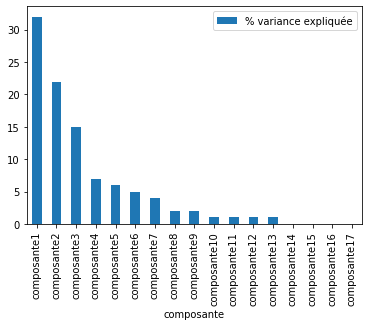

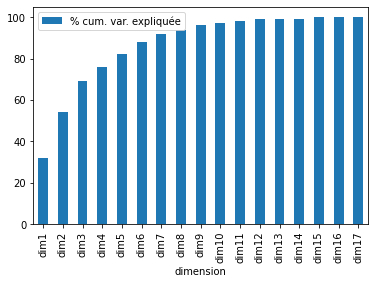

In [158]:
#ACP
from sklearn.decomposition import PCA
ACP1= PCA()
ACP1.fit(Xt_scaled)#entrainer l'acp sur Xt normalisé 
print('variance expliqué pour chaque variable \n',ACP1.explained_variance_)#imprimer la variance
print('ratio de la variance pour chaque variable \n',ACP1.explained_variance_ratio_)#imprimer le taux de la variance 
dt = pd.DataFrame(
    {
        "composante" : ["composante" + str(x + 1) for x in range(17)],
        
        "Variance expliquée" : ACP1.explained_variance_,
        
        "% variance expliquée" : np.round(ACP1.explained_variance_ratio_ * 100),
        "dimension":["dim"+ str(x + 1) for x in range(17)],
        "% cum. var. expliquée" : np.round(np.cumsum(ACP1.explained_variance_ratio_) * 100)
    }

)
display(dt)
dt.plot.bar(x = "composante" , y = "% variance expliquée")
dt.plot.bar(x = "dimension", y = "% cum. var. expliquée")


In [159]:
ACP1= PCA(n_components=10)
ACP1.fit(Xt_scaled)#entrainer l'acp 

Xt_acp=ACP1.transform(Xt_scaled)
datat=pd.DataFrame(Xt_acp)#transformer le tableu numpy to data frame 
datat.columns=['composante '+ str(x + 1) for x in range(10)]

In [171]:
X1_train, X1_test, y1_train, y1_test = train_test_split(datat, yt, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux de chaque cas  de fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux de chaque cas de  fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (36847, 10)
Test set: (9212, 10)


16    33459
15     1685
14      580
12      539
4       165
13      104
8        76
11       74
10       58
3        33
9        22
7        17
2        15
6        12
5         8
Name: fenetre, dtype: int64

16    8393
15     407
12     125
14     125
4       41
13      26
8       26
11      21
10      17
3        9
2        8
9        5
5        4
7        3
6        2
Name: fenetre, dtype: int64

taux de chaque cas  de fenetre pour le data set d entainement


16    0.908052
15    0.045730
14    0.015741
12    0.014628
4     0.004478
13    0.002822
8     0.002063
11    0.002008
10    0.001574
3     0.000896
9     0.000597
7     0.000461
2     0.000407
6     0.000326
5     0.000217
Name: fenetre, dtype: float64

taux de chaque cas de  fenetre pour le data set Validation


16    0.911094
15    0.044182
12    0.013569
14    0.013569
4     0.004451
13    0.002822
8     0.002822
11    0.002280
10    0.001845
3     0.000977
2     0.000868
9     0.000543
5     0.000434
7     0.000326
6     0.000217
Name: fenetre, dtype: float64

In [172]:
print('Acp')
importance(evaluation,datat)

Acp
RandomForest
[[   8    0    1    0    2    0    6    0    0    0    0    0    0    0
     0]
 [   0    5    2    1    0    0   13    0    0    0    0    0    0    0
     0]
 [   0    0   81    0    0    2   39    0    0    3    0    0    0    0
     0]
 [   0    0    0    8    3    2   12    0    0    0    0    0    0    0
     1]
 [   0    0    0    0   61    2   62    0    0    0    0    0    0    0
     0]
 [   0    0    1    0    0  204  202    0    0    0    0    0    0    0
     0]
 [   1    0    5    2    6   15 8359    0    0    1    0    0    1    3
     0]
 [   0    0    1    0    1    0    3    1    0    2    0    0    0    0
     0]
 [   0    0    0    0    0    2    0    0    7    0    0    0    0    0
     0]
 [   0    2    0    0    0    0   16    0    0   22    0    0    0    1
     0]
 [   0    0    0    0    0    0    1    0    0    0    3    0    0    0
     0]
 [   0    0    0    0    1    0    1    0    0    0    0    0    0    0
     0]
 [   0    0    0    0  

,importance
composante 10,0.118277
composante 1,0.109371
composante 6,0.108634
composante 2,0.107614
composante 9,0.106572
composante 3,0.100280
composante 5,0.093474
composante 8,0.091652
composante 7,0.091315
composante 4,0.072810


In [170]:
X1_train, X1_test, y1_train, y1_test = train_test_split(Xt, yt, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux de chaque état  de fenetre pour le data set d entrainement')
display(y1_train.value_counts(normalize=True))
print('taux de chaque état de  fenetre pour le data set de test ')
display(y1_test.value_counts(normalize=True))

Train set: (36847, 17)
Test set: (9212, 17)


16    33459
15     1685
14      580
12      539
4       165
13      104
8        76
11       74
10       58
3        33
9        22
7        17
2        15
6        12
5         8
Name: fenetre, dtype: int64

16    8393
15     407
12     125
14     125
4       41
13      26
8       26
11      21
10      17
3        9
2        8
9        5
5        4
7        3
6        2
Name: fenetre, dtype: int64

taux de chaque état  de fenetre pour le data set d entrainement


16    0.908052
15    0.045730
14    0.015741
12    0.014628
4     0.004478
13    0.002822
8     0.002063
11    0.002008
10    0.001574
3     0.000896
9     0.000597
7     0.000461
2     0.000407
6     0.000326
5     0.000217
Name: fenetre, dtype: float64

taux de chaque état de  fenetre pour le data set de test 


16    0.911094
15    0.044182
12    0.013569
14    0.013569
4     0.004451
13    0.002822
8     0.002822
11    0.002280
10    0.001845
3     0.000977
2     0.000868
9     0.000543
5     0.000434
7     0.000326
6     0.000217
Name: fenetre, dtype: float64

In [165]:
print('Données simple')
importance(evaluation,Xt)

RandomForest
[[  13    0    1    0    1    0    1    0    0    0    0    1    0    0
     0]
 [   0   16    1    0    0    2    2    0    0    0    0    0    0    0
     0]
 [   0    3  108    0    0    0   12    0    0    2    0    0    0    0
     0]
 [   0    0    0   17    2    3    3    0    0    0    0    0    0    0
     1]
 [   0    0    0    3   96    2   20    1    0    0    1    1    0    1
     0]
 [   0    0    0    1    2  309   93    0    0    0    0    0    1    1
     0]
 [   0    0    7    1    9   22 8348    0    0    2    0    0    1    3
     0]
 [   0    0    1    0    0    0    2    2    0    3    0    0    0    0
     0]
 [   0    0    0    0    0    1    0    0    8    0    0    0    0    0
     0]
 [   0    0    0    0    0    0    9    0    0   31    0    0    0    1
     0]
 [   0    0    0    0    0    0    0    0    0    0    3    0    0    1
     0]
 [   0    0    0    0    1    0    0    0    0    0    0    1    0    0
     0]
 [   0    0    0    0    0 

,importance
T_ext,0.099412
HR_cuisine,0.092939
CO2_ch1,0.069434
HR_salon,0.067027
T_salon,0.065649
T_cuisine,0.065325
CO2_salon,0.062855
CO2_ch2,0.062612
T_ch1,0.050828
HR_ch1,0.050678


In [167]:
X1_train, X1_test, y1_train, y1_test = train_test_split(Xtd, ytd, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux de chaque cas  de fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux de chaque cas de  fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (36847, 20)
Test set: (9212, 20)


16    33459
15     1685
14      580
12      539
4       165
13      104
8        76
11       74
10       58
3        33
9        22
7        17
2        15
6        12
5         8
Name: fenetre, dtype: int64

16    8393
15     407
12     125
14     125
4       41
13      26
8       26
11      21
10      17
3        9
2        8
9        5
5        4
7        3
6        2
Name: fenetre, dtype: int64

taux de chaque cas  de fenetre pour le data set d entainement


16    0.908052
15    0.045730
14    0.015741
12    0.014628
4     0.004478
13    0.002822
8     0.002063
11    0.002008
10    0.001574
3     0.000896
9     0.000597
7     0.000461
2     0.000407
6     0.000326
5     0.000217
Name: fenetre, dtype: float64

taux de chaque cas de  fenetre pour le data set Validation


16    0.911094
15    0.044182
12    0.013569
14    0.013569
4     0.004451
13    0.002822
8     0.002822
11    0.002280
10    0.001845
3     0.000977
2     0.000868
9     0.000543
5     0.000434
7     0.000326
6     0.000217
Name: fenetre, dtype: float64

In [168]:
print('Données simple + heure + jour+ mois')
importance(evaluation,Xtd)

RandomForest
[[  13    0    1    0    2    0    0    0    0    0    0    1    0    0
     0]
 [   0   17    1    0    0    1    2    0    0    0    0    0    0    0
     0]
 [   0    3  112    0    0    0    8    0    0    2    0    0    0    0
     0]
 [   0    0    0   16    2    4    3    0    0    0    0    0    0    0
     1]
 [   0    0    0    4  100    2   15    1    0    0    1    1    0    1
     0]
 [   0    0    0    1    2  319   83    0    0    0    0    0    1    1
     0]
 [   0    0    7    2    8   28 8341    0    0    2    0    0    1    4
     0]
 [   0    0    1    0    0    0    1    3    0    3    0    0    0    0
     0]
 [   0    0    0    0    0    1    0    0    8    0    0    0    0    0
     0]
 [   0    0    0    0    0    0    5    0    0   35    0    0    0    1
     0]
 [   0    0    0    0    0    0    0    0    0    0    3    0    0    1
     0]
 [   0    0    0    0    1    0    0    0    0    0    0    1    0    0
     0]
 [   0    0    0    0    0 

,importance
T_ext,0.089968
HR_cuisine,0.085313
HR_salon,0.062870
CO2_ch1,0.060714
T_salon,0.057883
T_cuisine,0.056652
CO2_salon,0.055183
CO2_ch2,0.054789
HR_ext,0.045625
Ihd,0.045567


In [62]:
pd.to_datetime(dft.index,format='%m/%d/%y')

DatetimeIndex(['2018-12-13 17:20:00', '2018-12-13 17:25:00',
               '2018-12-13 17:30:00', '2018-12-13 17:35:00',
               '2018-12-13 17:40:00', '2018-12-13 17:45:00',
               '2018-12-13 17:50:00', '2018-12-13 17:55:00',
               '2018-12-13 18:00:00', '2018-12-13 18:05:00',
               ...
               '2019-05-22 15:45:00', '2019-05-22 15:50:00',
               '2019-05-22 15:55:00', '2019-05-22 16:00:00',
               '2019-05-22 16:05:00', '2019-05-22 16:10:00',
               '2019-05-22 16:15:00', '2019-05-22 16:20:00',
               '2019-05-22 16:25:00', '2019-05-22 16:30:00'],
              dtype='datetime64[ns]', name='Date', length=46059, freq=None)

#  #==============================================================#

# heure &jour

In [16]:
pd.to_datetime(df1['Date'], format='%m/%d/%y')
df1=df1.set_index('Date')
df1_avec_date=df1.copy()
#df1=df1.loc['date début':'date fin']# si ya une anomalie dans les données en peu selection les dates quand veu prendre 
df1_avec_date['jour'] = df1_avec_date.index.weekday#day_name()
df1_avec_date['heure'] = df1_avec_date.index.hour
df1_avec_date['mois'] = df1_avec_date.index.month
#df1['nom de la journé']=df1.index.day_name()

#================== Chambre 2 ====================#

pd.to_datetime(df2['Date'], format='%m/%d/%y')
df2=df2.set_index('Date')
df2_avec_date=df2.copy()
#df2=df2.loc['2018-12-12 19:00:00':'2019-03-24 12:00:00']
df2_avec_date['jour'] = df2_avec_date.index.weekday#day_name()
df2_avec_date['heure'] = df2_avec_date.index.hour
df2_avec_date['mois'] = df2_avec_date.index.month

#=================== Cuisine =====================#

pd.to_datetime(dfc['Date'], format='%m/%d/%y')
dfc=dfc.set_index('Date')
dfc_avec_date=dfc.copy()
#dfc=dfc.loc['':'']
dfc_avec_date['jour'] = dfc_avec_date.index.weekday#day_name()
dfc_avec_date['heure'] = dfc_avec_date.index.hour
dfc_avec_date['mois'] = dfc_avec_date.index.month
#==================== salon ======================#

pd.to_datetime(dfs['Date'], format='%m/%d/%y')
dfs=dfs.set_index('Date')
dfs_avec_date=dfs.copy()
#dfs=dfs.loc['':'']
dfs_avec_date['jour'] = dfs_avec_date.index.weekday#day_name()
dfs_avec_date['heure'] = dfs_avec_date.index.hour
dfs_avec_date['mois'] = dfs_avec_date.index.month

In [17]:

#supprimé les valeurs manquantes pour tout les fenetres 
df1.dropna(axis = 0, how = 'any',inplace=True)
df2.dropna(axis = 0, how = 'any',inplace=True)
dfc.dropna(axis = 0, how = 'any',inplace=True)
dfs.dropna(axis = 0, how = 'any',inplace=True)
df1_avec_date.dropna(axis = 0, how = 'any',inplace=True)
df2_avec_date.dropna(axis = 0, how = 'any',inplace=True)
dfc_avec_date.dropna(axis = 0, how = 'any',inplace=True)
dfs_avec_date.dropna(axis = 0, how = 'any',inplace=True)





In [18]:
#=== Data normale ====#
y1 = df1['fen_ch1']
X1 = df1.drop(['fen_ch1'], axis=1)
#==== suprimé le HR_ext , IHD ========#
X1_ = df1.drop(['fen_ch1','HR_ext','Ihd'], axis=1)
#======= Data normal  L'heure et le joure  ========#
X1_avec_date = df1_avec_date.drop(['fen_ch1'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
X1_avec_date_ = df1_avec_date.drop(['fen_ch1','HR_ext','Ihd'], axis=1)


                  #==================== Chambre 2 =============================#
    
#=== Data normale ====#    
y2 = df2['fen_ch2']
X2 = df2.drop(['fen_ch2'], axis=1)
#==== suprimé le HR_ext , IHD ========#
X2_ = df2.drop(['fen_ch2','HR_ext','Ihd'], axis=1)
#======= Data L'heure et le joure  ========# 
X2_avec_date = df2_avec_date.drop(['fen_ch2'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
X2_avec_date_ = df2_avec_date.drop(['fen_ch2','HR_ext','Ihd'], axis=1)


                  #====================== Cuisine ===========================#
    
#=== Data normale ====# 
yc = dfc['fen_cuisine']
Xc = dfc.drop(['fen_cuisine'], axis=1)
#==== suprimé le HR_ext , IHD ========#
Xc_ = dfc.drop(['fen_cuisine','HR_ext','Ihd'], axis=1)
#======= Data normal avec  L'heure et le joure  ========#
Xc_avec_date = dfc_avec_date.drop(['fen_cuisine'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
Xc_avec_date_ = dfc_avec_date.drop(['fen_cuisine','HR_ext','Ihd'], axis=1)

                  #======================= Salon =========================#
    
#=== Data normale ====# 
ys = dfs['fen_salon']
Xs = dfs.drop(['fen_salon'], axis=1)
#==== suprimé le HR_ext , IHD ========#
Xs_ = dfs.drop(['fen_salon','HR_ext','Ihd'], axis=1)
#======= Data normal avec  L'heure et le joure  ========#
Xs_avec_date = dfs_avec_date.drop(['fen_salon'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
Xs_avec_date_ = dfs_avec_date.drop(['fen_salon','HR_ext','Ihd'], axis=1)


In [19]:
display(Xc,Xc_,Xc_avec_date,Xc_avec_date_)

,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,T_cuisine,HR_cuisine
Date,,,,,,,,
2018-12-13 17:20:00,15,15,83,337,1.4,-1.3,20.126,36.898
2018-12-13 17:25:00,15,15,82,37,2.3,-1.3,20.126,36.898
2018-12-13 17:30:00,0,0,83,359,1.2,-1.3,22.250,38.521
2018-12-13 17:35:00,0,0,83,14,1.9,-1.3,22.250,38.521
2018-12-13 17:40:00,0,0,83,6,2.3,-1.1,22.417,39.259
...,...,...,...,...,...,...,...,...
2019-05-22 16:20:00,60400,13141,30,10,5.8,21.8,22.848,40.968
2019-05-22 16:25:00,60340,12767,29,6,2.1,22.0,22.848,40.968
2019-05-22 16:30:00,59030,12449,30,16,3.4,22.1,22.848,40.968


,Ihg,Wd,Ws,T_ext,T_cuisine,HR_cuisine
Date,,,,,,
2018-12-13 17:20:00,15,337,1.4,-1.3,20.126,36.898
2018-12-13 17:25:00,15,37,2.3,-1.3,20.126,36.898
2018-12-13 17:30:00,0,359,1.2,-1.3,22.250,38.521
2018-12-13 17:35:00,0,14,1.9,-1.3,22.250,38.521
2018-12-13 17:40:00,0,6,2.3,-1.1,22.417,39.259
...,...,...,...,...,...,...
2019-05-22 16:20:00,60400,10,5.8,21.8,22.848,40.968
2019-05-22 16:25:00,60340,6,2.1,22.0,22.848,40.968
2019-05-22 16:30:00,59030,16,3.4,22.1,22.848,40.968


,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,T_cuisine,HR_cuisine,jour,heure,mois
Date,,,,,,,,,,,
2018-12-13 17:20:00,15,15,83,337,1.4,-1.3,20.126,36.898,3,17,12
2018-12-13 17:25:00,15,15,82,37,2.3,-1.3,20.126,36.898,3,17,12
2018-12-13 17:30:00,0,0,83,359,1.2,-1.3,22.250,38.521,3,17,12
2018-12-13 17:35:00,0,0,83,14,1.9,-1.3,22.250,38.521,3,17,12
2018-12-13 17:40:00,0,0,83,6,2.3,-1.1,22.417,39.259,3,17,12
...,...,...,...,...,...,...,...,...,...,...,...
2019-05-22 16:20:00,60400,13141,30,10,5.8,21.8,22.848,40.968,2,16,5
2019-05-22 16:25:00,60340,12767,29,6,2.1,22.0,22.848,40.968,2,16,5
2019-05-22 16:30:00,59030,12449,30,16,3.4,22.1,22.848,40.968,2,16,5


,Ihg,Wd,Ws,T_ext,T_cuisine,HR_cuisine,jour,heure,mois
Date,,,,,,,,,
2018-12-13 17:20:00,15,337,1.4,-1.3,20.126,36.898,3,17,12
2018-12-13 17:25:00,15,37,2.3,-1.3,20.126,36.898,3,17,12
2018-12-13 17:30:00,0,359,1.2,-1.3,22.250,38.521,3,17,12
2018-12-13 17:35:00,0,14,1.9,-1.3,22.250,38.521,3,17,12
2018-12-13 17:40:00,0,6,2.3,-1.1,22.417,39.259,3,17,12
...,...,...,...,...,...,...,...,...,...
2019-05-22 16:20:00,60400,10,5.8,21.8,22.848,40.968,2,16,5
2019-05-22 16:25:00,60340,6,2.1,22.0,22.848,40.968,2,16,5
2019-05-22 16:30:00,59030,16,3.4,22.1,22.848,40.968,2,16,5


In [20]:
from sklearn.preprocessing import StandardScaler
#=======================================#
scaler1=StandardScaler()
scaler1.fit(X1_avec_date)
X1_scaled=scaler1.transform(X1_avec_date)
X1_scaled=pd.DataFrame(X1_scaled)
X1_scaled.columns=X1_avec_date.columns
#=======================================#
scaler2=StandardScaler()
scaler2.fit(X2_avec_date)
X2_scaled=scaler2.transform(X2_avec_date)
X2_scaled=pd.DataFrame(X2_scaled)
X2_scaled.columns=X2_avec_date.columns
#=======================================#
scaler_c=StandardScaler()
scaler_c.fit(Xc_avec_date)
Xc_scaled=scaler_c.transform(Xc_avec_date)
Xc_scaled=pd.DataFrame(Xc_scaled)
Xc_scaled.columns=Xc_avec_date.columns
#=======================================#
scaler_s=StandardScaler()
scaler_s.fit(Xs_avec_date)
Xs_scaled=scaler_s.transform(Xs_avec_date)
Xs_scaled=pd.DataFrame(Xs_scaled)
Xs_scaled.columns=Xs_avec_date.columns
#=======================================#

# ===============Chambre1==================== 

In [30]:

X1_train, X1_test, y1_train, y1_test = train_test_split(X1_scaled, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (36848, 12)
Test set: (9213, 12)


1    36525
0      323
Name: fen_ch1, dtype: int64

1    9117
0      96
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.991234
0    0.008766
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.98958
0    0.01042
Name: fen_ch1, dtype: float64

In [31]:
importance(evaluation,X1_scaled)

DecisionTreeClassifier
[[  74   22]
 [  27 9090]]
              precision    recall  f1-score   support

           0       0.73      0.77      0.75        96
           1       1.00      1.00      1.00      9117

    accuracy                           0.99      9213
   macro avg       0.87      0.88      0.87      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of DecisionTreeClassifier(random_state=0)>


,importance
CO2_ch1,0.141461
T_ch1,0.140962
jour,0.120788
HR_ch1,0.103037
heure,0.094439
Ihg,0.086267
Ihd,0.073032
HR_ext,0.071456
T_ext,0.064856
Wd,0.044513


RandomForest
[[  62   34]
 [   8 9109]]
              precision    recall  f1-score   support

           0       0.89      0.65      0.75        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.94      0.82      0.87      9213
weighted avg       1.00      1.00      1.00      9213

les paramètres <bound method BaseEstimator.get_params of RandomForestClassifier(random_state=0)>


,importance
CO2_ch1,0.118389
HR_ch1,0.110109
T_ext,0.093175
HR_ext,0.091516
Ihg,0.090659
T_ch1,0.090015
Ihd,0.089442
jour,0.080292
Wd,0.071654
Ws,0.065569


AdaBoost
[[   9   87]
 [   9 9108]]
              precision    recall  f1-score   support

           0       0.50      0.09      0.16        96
           1       0.99      1.00      0.99      9117

    accuracy                           0.99      9213
   macro avg       0.75      0.55      0.58      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of AdaBoostClassifier(random_state=0)>


,importance
CO2_ch1,0.18
T_ext,0.16
HR_ext,0.12
HR_ch1,0.12
T_ch1,0.10
heure,0.10
Ihd,0.08
Wd,0.06
Ihg,0.04
jour,0.04


XGboost
[14:58:06] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[  71   25]
 [   7 9110]]
              precision    recall  f1-score   support

           0       0.91      0.74      0.82        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.95      0.87      0.91      9213
weighted avg       1.00      1.00      1.00      9213

les paramètres <bound method XGBModel.get_params of XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weigh

,importance
jour,0.171261
heure,0.102609
T_ch1,0.097365
Ihg,0.095160
mois,0.088608
HR_ch1,0.083605
HR_ext,0.073007
Ihd,0.072760
T_ext,0.072603
CO2_ch1,0.066055


Regression_logistic
[[   0   96]
 [   3 9114]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        96
           1       0.99      1.00      0.99      9117

    accuracy                           0.99      9213
   macro avg       0.49      0.50      0.50      9213
weighted avg       0.98      0.99      0.98      9213

les paramètres <bound method BaseEstimator.get_params of LogisticRegression(random_state=0)>
SVM
[[   5   91]
 [   0 9117]]
              precision    recall  f1-score   support

           0       1.00      0.05      0.10        96
           1       0.99      1.00      1.00      9117

    accuracy                           0.99      9213
   macro avg       1.00      0.53      0.55      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of SVC(random_state=0)>
KNN
[[  68   28]
 [  17 9100]]
              precision    recall  f1-score   support

           

In [32]:
rf = RandomForestClassifier()
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
Kfold=KFold(n_splits=5, shuffle=True,random_state=0)
sc=cross_val_score(rf,X1_avec_date,y1,cv=Kfold)
sc.mean()

0.9961572640446189

In [33]:
# jeux train+validation set et test set
X_trainval, X_test, y_trainval, y_test = train_test_split(X1_avec_date, y1,test_size=0.2, random_state=5)
# jeux train+validation set en training et  validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
    #       for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evalué le Rf dans validation set
                score = rf.score(X_valid, y_valid)
        
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval, y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))

Size of training set: 29478   size of validation set: 7370   size of test set: 9213

Best score on validation set: 1.00
Best parameters:  {'n_estimators': 200, 'max_depth': 26}
Test set score with best parameters: 1.00
[[  65   31]
 [   8 9109]]
              precision    recall  f1-score   support

           0       0.89      0.68      0.77        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.94      0.84      0.88      9213
weighted avg       1.00      1.00      1.00      9213



## données simple

In [27]:

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (36848, 9)
Test set: (9213, 9)


1    36525
0      323
Name: fen_ch1, dtype: int64

1    9117
0      96
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.991234
0    0.008766
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.98958
0    0.01042
Name: fen_ch1, dtype: float64

In [28]:
importance(evaluation,X1)

DecisionTreeClassifier
[[  62   34]
 [  32 9085]]
              precision    recall  f1-score   support

           0       0.66      0.65      0.65        96
           1       1.00      1.00      1.00      9117

    accuracy                           0.99      9213
   macro avg       0.83      0.82      0.82      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of DecisionTreeClassifier(random_state=0)>


,importance
CO2_ch1,0.255038
T_ch1,0.133875
HR_ch1,0.114585
T_ext,0.110005
Ihd,0.092854
HR_ext,0.089744
Ihg,0.087163
Wd,0.072135
Ws,0.044602


RandomForest
[[  53   43]
 [   4 9113]]
              precision    recall  f1-score   support

           0       0.93      0.55      0.69        96
           1       1.00      1.00      1.00      9117

    accuracy                           0.99      9213
   macro avg       0.96      0.78      0.85      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of RandomForestClassifier(random_state=0)>


,importance
CO2_ch1,0.146196
HR_ch1,0.136371
Ihg,0.115603
T_ext,0.115098
HR_ext,0.105564
T_ch1,0.103641
Ihd,0.102075
Ws,0.088842
Wd,0.086610


AdaBoost
[[   5   91]
 [   5 9112]]
              precision    recall  f1-score   support

           0       0.50      0.05      0.09        96
           1       0.99      1.00      0.99      9117

    accuracy                           0.99      9213
   macro avg       0.75      0.53      0.54      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of AdaBoostClassifier(random_state=0)>


,importance
CO2_ch1,0.26
HR_ext,0.16
T_ext,0.16
T_ch1,0.12
HR_ch1,0.12
Ihg,0.06
Ihd,0.06
Wd,0.06
Ws,0.00


XGboost
[14:57:44] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[  63   33]
 [   8 9109]]
              precision    recall  f1-score   support

           0       0.89      0.66      0.75        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.94      0.83      0.88      9213
weighted avg       1.00      1.00      1.00      9213

les paramètres <bound method XGBModel.get_params of XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weigh

,importance
Ihg,0.147906
T_ch1,0.129630
CO2_ch1,0.128467
HR_ch1,0.122217
T_ext,0.114613
HR_ext,0.111001
Ihd,0.105767
Ws,0.075178
Wd,0.065221


Regression_logistic
[[   0   96]
 [   0 9117]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        96
           1       0.99      1.00      0.99      9117

    accuracy                           0.99      9213
   macro avg       0.49      0.50      0.50      9213
weighted avg       0.98      0.99      0.98      9213

les paramètres <bound method BaseEstimator.get_params of LogisticRegression(random_state=0)>
SVM
[[   0   96]
 [   0 9117]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        96
           1       0.99      1.00      0.99      9117

    accuracy                           0.99      9213
   macro avg       0.49      0.50      0.50      9213
weighted avg       0.98      0.99      0.98      9213

les paramètres <bound method BaseEstimator.get_params of SVC(random_state=0)>
KNN
[[   4   92]
 [  15 9102]]
              precision    recall  f1-score   support

           

## recherche sur gril simple 

In [26]:

X_train, X_test, y_train, y_test = train_test_split(
    X1, y1, test_size=0.2, random_state=5)
print("Size of training set: {}   size of test set: {}".format(
      X_train.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [300,350,400]:
    for max_depth in [20]:
       # for  min_samples_leaf in [1]:
           # for max_features in ['auto']:
                # for each combination of parameters, train an rf
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_test, y_test)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}#,'min_samples_leaf': min_samples_leaf,'max_features': max_features}
print("Best score: {:.2f}".format(best_score))
print("Best parameters: {}".format(best_parameters))
print("#############  raport de classification  ##################")                        
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_train, y_train)
ypred=rf.predict(X_test)
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))

Size of training set: 36848   size of test set: 9213
Best score: 1.00
Best parameters: {'n_estimators': 300, 'max_depth': 20}
#############  raport de classification  ##################
[[  57   39]
 [   4 9113]]
              precision    recall  f1-score   support

           0       0.93      0.59      0.73        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.97      0.80      0.86      9213
weighted avg       1.00      1.00      0.99      9213



### Recherche sur grill sur des données de validation 

In [29]:

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(X1, y1,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [250,300,350]:
    for max_depth in [20]:
       # for  min_samples_leaf in [1,2,3]:
    #       for max_features in ['auto']:
                # for each combination of parameters, 
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval, y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 29478   size of validation set: 7370   size of test set: 9213

Best score on validation set: 1.00
Best parameters:  {'n_estimators': 300, 'max_depth': 20}
Test set score with best parameters: 1.00
[[  55   41]
 [   4 9113]]
              precision    recall  f1-score   support

           0       0.93      0.57      0.71        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.96      0.79      0.85      9213
weighted avg       0.99      1.00      0.99      9213



In [31]:
from sklearn.model_selection import cross_validate
res = cross_validate(rf,X1,y1, cv=5,
                     return_train_score=True)
display(res)

{'fit_time': array([ 9.07318449, 10.50475621, 11.60192227, 13.84478998, 10.53467202]),
 'score_time': array([0.17683768, 0.23383021, 0.32202578, 0.27473998, 0.31610298]),
 'test_score': array([0.99164224, 0.98762484, 0.983934  , 0.98458532, 0.98719062]),
 'train_score': array([1., 1., 1., 1., 1.])}

In [32]:
for n_estimators in [300,350,400]:
    for max_depth in [12,20,22]:
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)
                scores = cross_val_score(rf,X_trainval,y_trainval,cv=5)
                score=np.mean(scores)
                if score > best_score:
                    best_score=score
                    best_parameters={'n_estimators': n_estimators ,'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval,y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Best score on validation set: 1.00
Best parameters:  {'n_estimators': 300, 'max_depth': 20}
Test set score with best parameters: 1.00
[[  55   41]
 [   5 9112]]
              precision    recall  f1-score   support

           0       0.92      0.57      0.71        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.96      0.79      0.85      9213
weighted avg       0.99      1.00      0.99      9213



### chambre 1 sans HR_ext et IHD

In [33]:

X1_train, X1_test, y1_train, y1_test = train_test_split(X1_, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (36848, 8)
Test set: (9213, 8)


1    36525
0      323
Name: fen_ch1, dtype: int64

1    9117
0      96
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.991234
0    0.008766
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.98958
0    0.01042
Name: fen_ch1, dtype: float64

In [34]:
importance(evaluation,X1_)

RandomForest
[[  48   48]
 [   7 9110]]
              precision    recall  f1-score   support

           0       0.87      0.50      0.64        96
           1       0.99      1.00      1.00      9117

    accuracy                           0.99      9213
   macro avg       0.93      0.75      0.82      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of RandomForestClassifier(random_state=5)>


,importance
CO2_ch1,0.171161
Ihg,0.156862
HR_ch1,0.135738
T_ext,0.135611
T_ch1,0.121059
Ws,0.109869
Wd,0.104983
mois,0.064715


### Chambre 1 avec l' heure ,jour,mois de la semaine  

,Ihg,Ihd,HR_ext,Wd,Ws,T_ext,T_ch1,HR_ch1,CO2_ch1,joure,heure,mois
Date,,,,,,,,,,,,
2018-12-13 17:20:00,15,15,83,337,1.4,-1.3,20.6,38,944,3,17,12
2018-12-13 17:25:00,15,15,82,37,2.3,-1.3,20.6,38,944,3,17,12
2018-12-13 17:30:00,0,0,83,359,1.2,-1.3,21.1,39,1144,3,17,12
2018-12-13 17:35:00,0,0,83,14,1.9,-1.3,21.1,39,1144,3,17,12
2018-12-13 17:40:00,0,0,83,6,2.3,-1.1,21.5,39,1178,3,17,12
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-22 16:20:00,60400,13141,30,10,5.8,21.8,22.1,46,951,2,16,5
2019-05-22 16:25:00,60340,12767,29,6,2.1,22.0,22.1,46,951,2,16,5
2019-05-22 16:30:00,59030,12449,30,16,3.4,22.1,22.2,46,987,2,16,5


In [59]:

X1_train, X1_test, y1_train, y1_test = train_test_split(X1_avec_date, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (36848, 12)
Test set: (9213, 12)


1    36525
0      323
Name: fen_ch1, dtype: int64

1    9117
0      96
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.991234
0    0.008766
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.98958
0    0.01042
Name: fen_ch1, dtype: float64

In [61]:
importance(evaluation,X1_avec_date)

RandomForest
[[  62   34]
 [   7 9110]]
              precision    recall  f1-score   support

           0       0.90      0.65      0.75        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.95      0.82      0.87      9213
weighted avg       1.00      1.00      1.00      9213

les paramètres <bound method BaseEstimator.get_params of RandomForestClassifier(random_state=5)>


,importance
CO2_ch1,0.119304
HR_ch1,0.103581
Ihg,0.096328
T_ext,0.094152
T_ch1,0.089787
HR_ext,0.089608
Ihd,0.088371
joure,0.077724
Ws,0.068360
Wd,0.066742


In [62]:
#simple grid serch 
X_train, X_test, y_train, y_test = train_test_split(
    X1_avec_date, y1, test_size=0.2, random_state=5)
print("Size of training set: {}   size of test set: {}".format(
      X_train.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300]:
    for max_depth in [12,15,20]:
       # for  min_samples_leaf in [1]:
            for max_features in ['auto']:
                # for each combination of parameters, train an rf
                rf_=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)
                rf_.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf_.score(X_test, y_test)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}#,'min_samples_leaf': min_samples_leaf,'max_features': max_features}
print("Best score: {:.2f}".format(best_score))
print("Best parameters: {}".format(best_parameters)) 
rf_=RandomForestClassifier(**best_parameters)
rf_.fit(X_train, y_train)
ypred_=rf_.predict(X_test)
print(confusion_matrix(y_test, ypred_))
print(classification_report(y_test, ypred_))

Size of training set: 36848   size of test set: 9213
Best score: 1.00
Best parameters: {'n_estimators': 100, 'max_depth': 20}


In [63]:
#recherche sur gril sur data set de validation  

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(X1_avec_date, y1,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300]:
    for max_depth in [20]:
       # for  min_samples_leaf in [1,2,3]:
           for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf_=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf_.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf_.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf_=RandomForestClassifier(**best_parameters)
rf_.fit(X_trainval, y_trainval)
ypred=rf_.predict(X_test)
test_score = rf_.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 29478   size of validation set: 7370   size of test set: 9213

Best score on validation set: 1.00
Best parameters:  {'n_estimators': 100, 'max_depth': 20}
Test set score with best parameters: 1.00
[[  62   34]
 [   7 9110]]
              precision    recall  f1-score   support

           0       0.90      0.65      0.75        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.95      0.82      0.87      9213
weighted avg       1.00      1.00      1.00      9213



In [64]:
b=pd.DataFrame(rf_.feature_importances_,index=X1_avec_date.columns)
b.columns=['importance']         
b.sort_values(by='importance',inplace=True,ascending=False) # afficher le tableau dans un ordre décroisant 
display(b)# afficher le tableau 

,importance
HR_ch1,0.111070
CO2_ch1,0.110186
Ihd,0.095938
Ihg,0.091396
T_ch1,0.089664
HR_ext,0.089267
T_ext,0.087187
joure,0.085949
Ws,0.070879
Wd,0.066681


In [65]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1_avec_date_, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entrainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (36848, 10)
Test set: (9213, 10)


1    36525
0      323
Name: fen_ch1, dtype: int64

1    9117
0      96
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entrainement


1    0.991234
0    0.008766
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.98958
0    0.01042
Name: fen_ch1, dtype: float64

In [66]:
importance(evaluation,X1_avec_date_)

RandomForest
[[  61   35]
 [   8 9109]]
              precision    recall  f1-score   support

           0       0.88      0.64      0.74        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.94      0.82      0.87      9213
weighted avg       1.00      1.00      0.99      9213

les paramètres <bound method BaseEstimator.get_params of RandomForestClassifier(random_state=5)>


,importance
CO2_ch1,0.147854
HR_ch1,0.117673
T_ext,0.116081
Ihg,0.114814
T_ch1,0.108867
Ws,0.088259
joure,0.088162
Wd,0.086063
heure,0.077183
mois,0.055044


In [67]:
#simple grid serch 
X_train, X_test, y_train, y_test = train_test_split(
    X1_avec_date_, y1, test_size=0.2, random_state=5)
print("Size of training set: {}   size of test set: {}".format(
      X_train.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300]:
    for max_depth in [12,20,22]:
       # for  min_samples_leaf in [1]:
            for max_features in ['auto']:
                # for each combination of parameters, train an rf
                rf__=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)
                rf__.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf__.score(X_test, y_test)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}#,'min_samples_leaf': min_samples_leaf,'max_features': max_features}
print("Best score: {:.2f}".format(best_score))
print("Best parameters: {}".format(best_parameters))                            
print("#############  raport de classification  ################## ")                        
rf__=RandomForestClassifier(**best_parameters)
rf__.fit(X_train, y_train)
ypred_=rf__.predict(X_test)
print(confusion_matrix(y_test, ypred_))
print(classification_report(y_test, ypred_))
                        


Size of training set: 36848   size of test set: 9213
Best score: 1.00
Best parameters: {'n_estimators': 300, 'max_depth': 20}
#############  raport de classification  ################## 
[[  64   32]
 [   8 9109]]
              precision    recall  f1-score   support

           0       0.89      0.67      0.76        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.94      0.83      0.88      9213
weighted avg       1.00      1.00      1.00      9213



In [31]:
df1['joure'] = df1.index.day_name()

In [32]:
import mglearn
import plotly.express as px
#================================================#
fig_1 = px.scatter_3d(df1,x='CO2_ch1',y='joure',z='T_ch1',color = df1['fen_ch1'])#symbol=dfc['fen_cuisine']) 
fig_1.show()

In [26]:
df1.groupby(['fen_ch1','joure','heure']).count().head(50)

Ihg  Ihd  HR_ext  Wd  Ws  T_ext  T_ch1  HR_ch1  CO2_ch1
fen_ch1 joure heure                                                         
0       0     13       1    1       1   1   1      1      1       1        1
              14       3    3       3   3   3      3      3       3        3
        1     13      12   12      12  12  12     12     12      12       12
              14      12   12      12  12  12     12     12      12       12
              15       2    2       2   2   2      2      2       2        2
              16       4    4       4   4   4      4      4       4        4
              17       5    5       5   5   5      5      5       5        5
              18       3    3       3   3   3      3      3       3        3
        2     13       1    1       1   1   1      1      1       1        1
              16       1    1       1   1   1      1      1       1        1
              17       1    1       1   1   1      1      1       1        1
              21       3    3       3   3   3      3      3       3        3
        3     9        7    7       7   7   7      7      7       7        7
              10      24   24      24  24  24     24     24      24       24
              11      29   29      29  29  29     29     29      29       29
              12      24   24      24  24  24     24     24      24       24
              13      35   35      35  35  35     35     35      35       35
              14      22   22      22  22  22     22     22      22       22
              15       2    2       2   2   2      2      2       2        2
              18       1    1       1   1   1      1      1       1        1
              19       5    5       5   5   5      5      5       5        5
              20       7    7       7   7   7      7      7       7        7
              21       1    1       1   1   1      1      1       1        1
        4     12       8    8       8   8   8      8      8       8        8
              16       3    3       3   3   3      3      3       3        3
              17      12   12      12  12  12     12     12      12       12
              18       3    3       3   3   3      3      3       3        3
              20       2    2       2   2   2      2      2       2        2
              21       1    1       1   1   1      1      1       1        1
              23       7    7       7   7   7      7      7       7        7
        5     9       10   10      10  10  10     10     10      10       10
              10      24   24      24  24  24     24     24      24       24
              11      22   22      22  22  22     22     22      22       22
              12      14   14      14  14  14     14     14      14       14
              13       6    6       6   6   6      6      6       6        6
              14       2    2       2   2   2      2      2       2        2
              16       4    4       4   4   4      4      4       4        4
              17      11   11      11  11  11     11     11      11       11
              18       4    4       4   4   4      4      4       4        4
              20       5    5       5   5   5      5      5       5        5
        6     0        1    1       1   1   1      1      1       1        1
              1        2    2       2   2   2      2      2       2        2
              10       5    5       5   5   5      5      5       5        5
              11      12   12      12  12  12     12     12      12       12
              12      15   15      15  15  15     15     15      15       15
              13      16   16      16  16  16     16     16      16       16
              14       2    2       2   2   2      2      2       2        2
              16       2    2       2   2   2      2      2       2        2
              19       4    4       4   4   4      4      4       4        4
              20       7    7       7   7   7      7      7       7        7

### Chambre 1 avec l heure et le joure sans HR et IHD

In [194]:

X1_train, X1_test, y1_train, y1_test = train_test_split(X1_avec_date_, y1, test_size=0.2, random_state=5)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (36848, 9)
Test set: (9213, 9)


1    36525
0      323
Name: fen_ch1, dtype: int64

1    9117
0      96
Name: fen_ch1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.991234
0    0.008766
Name: fen_ch1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.98958
0    0.01042
Name: fen_ch1, dtype: float64

In [195]:
importance(evaluation,X1_avec_date_)

DecisionTreeClassifier
[[  66   30]
 [  26 9091]]
              precision    recall  f1-score   support

           0       0.72      0.69      0.70        96
           1       1.00      1.00      1.00      9117

    accuracy                           0.99      9213
   macro avg       0.86      0.84      0.85      9213
weighted avg       0.99      0.99      0.99      9213



,importance
CO2_ch1,0.164975
HR_ch1,0.151793
T_ext,0.134279
Ihg,0.121662
Ws,0.100441
T_ch1,0.096581
heure,0.093279
joure,0.077702
Wd,0.059289


RandomForest
[[  58   38]
 [  10 9107]]
              precision    recall  f1-score   support

           0       0.85      0.60      0.71        96
           1       1.00      1.00      1.00      9117

    accuracy                           0.99      9213
   macro avg       0.92      0.80      0.85      9213
weighted avg       0.99      0.99      0.99      9213



,importance
CO2_ch1,0.161579
HR_ch1,0.121612
Ihg,0.120014
T_ch1,0.119799
T_ext,0.117962
Ws,0.102293
Wd,0.091733
heure,0.084086
joure,0.080923


XGboost
[13:51:34] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[  66   30]
 [  10 9107]]
              precision    recall  f1-score   support

           0       0.87      0.69      0.77        96
           1       1.00      1.00      1.00      9117

    accuracy                           1.00      9213
   macro avg       0.93      0.84      0.88      9213
weighted avg       1.00      1.00      1.00      9213



,importance
joure,0.153580
heure,0.136357
Ihg,0.134606
T_ch1,0.122171
HR_ch1,0.111440
CO2_ch1,0.104741
T_ext,0.102040
Ws,0.087518
Wd,0.047547


# ====================chambre 2===============================  

In [183]:

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=5)
print('Train set:', X2_train.shape)
print('Test set:', X2_test.shape)
display(y2_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y2_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y2_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y2_test.value_counts(normalize=True))

Train set: (36848, 9)
Test set: (9213, 9)


1    35944
0      904
Name: fen_ch2, dtype: int64

1    8985
0     228
Name: fen_ch2, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.975467
0    0.024533
Name: fen_ch2, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.975252
0    0.024748
Name: fen_ch2, dtype: float64

In [184]:
importance(evaluation2,X2)

DecisionTreeClassifier
[[ 159   69]
 [  56 8929]]
              precision    recall  f1-score   support

           0       0.74      0.70      0.72       228
           1       0.99      0.99      0.99      8985

    accuracy                           0.99      9213
   macro avg       0.87      0.85      0.86      9213
weighted avg       0.99      0.99      0.99      9213



,importance
CO2_ch2,0.168618
T_ext,0.144787
T_ch2,0.144401
HR_ch2,0.135089
Ws,0.115419
HR_ext,0.106341
Ihd,0.066709
Ihg,0.063433
Wd,0.055203


RandomForest
[[ 151   77]
 [   9 8976]]
              precision    recall  f1-score   support

           0       0.94      0.66      0.78       228
           1       0.99      1.00      1.00      8985

    accuracy                           0.99      9213
   macro avg       0.97      0.83      0.89      9213
weighted avg       0.99      0.99      0.99      9213



,importance
T_ext,0.171432
CO2_ch2,0.141792
HR_ch2,0.127482
T_ch2,0.112709
HR_ext,0.110599
Ws,0.095092
Ihd,0.087984
Ihg,0.081568
Wd,0.071342


XGboost
[13:46:19] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 180   48]
 [   9 8976]]
              precision    recall  f1-score   support

           0       0.95      0.79      0.86       228
           1       0.99      1.00      1.00      8985

    accuracy                           0.99      9213
   macro avg       0.97      0.89      0.93      9213
weighted avg       0.99      0.99      0.99      9213



,importance
T_ch2,0.169443
T_ext,0.127036
Ihd,0.125532
Ws,0.124897
HR_ch2,0.107811
CO2_ch2,0.104797
HR_ext,0.096240
Ihg,0.075158
Wd,0.069087


In [196]:
#sans HR ET IHG
X2_train, X2_test, y2_train, y2_test = train_test_split(X2_, y2, test_size=0.2, random_state=5)
print('Train set:', X2_train.shape)
print('Test set:', X2_test.shape)
display(y2_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y2_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y2_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y2_test.value_counts(normalize=True))

Train set: (36848, 7)
Test set: (9213, 7)


1    35944
0      904
Name: fen_ch2, dtype: int64

1    8985
0     228
Name: fen_ch2, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.975467
0    0.024533
Name: fen_ch2, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.975252
0    0.024748
Name: fen_ch2, dtype: float64

In [198]:
importance(evaluation2,X2_)

DecisionTreeClassifier
[[ 154   74]
 [  53 8932]]
              precision    recall  f1-score   support

           0       0.74      0.68      0.71       228
           1       0.99      0.99      0.99      8985

    accuracy                           0.99      9213
   macro avg       0.87      0.83      0.85      9213
weighted avg       0.99      0.99      0.99      9213



,importance
CO2_ch2,0.203034
T_ext,0.194585
T_ch2,0.156902
HR_ch2,0.133076
Ws,0.129362
Ihg,0.107528
Wd,0.075512


RandomForest
[[ 128  100]
 [   8 8977]]
              precision    recall  f1-score   support

           0       0.94      0.56      0.70       228
           1       0.99      1.00      0.99      8985

    accuracy                           0.99      9213
   macro avg       0.97      0.78      0.85      9213
weighted avg       0.99      0.99      0.99      9213



,importance
T_ext,0.195033
CO2_ch2,0.172808
HR_ch2,0.144073
T_ch2,0.138806
Ws,0.128455
Ihg,0.119714
Wd,0.101111


XGboost
[13:53:09] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 166   62]
 [   5 8980]]
              precision    recall  f1-score   support

           0       0.97      0.73      0.83       228
           1       0.99      1.00      1.00      8985

    accuracy                           0.99      9213
   macro avg       0.98      0.86      0.91      9213
weighted avg       0.99      0.99      0.99      9213



,importance
T_ch2,0.196398
Ws,0.168805
T_ext,0.157874
CO2_ch2,0.141755
HR_ch2,0.135301
Ihg,0.108429
Wd,0.091437


In [34]:
#avec heure et jour 
X2_train, X2_test, y2_train, y2_test = train_test_split(X2_scaled, y2, test_size=0.2, random_state=5)
print('Train set:', X2_train.shape)
print('Test set:', X2_test.shape)
display(y2_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y2_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y2_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y2_test.value_counts(normalize=True))

Train set: (36848, 12)
Test set: (9213, 12)


1    35944
0      904
Name: fen_ch2, dtype: int64

1    8985
0     228
Name: fen_ch2, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.975467
0    0.024533
Name: fen_ch2, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.975252
0    0.024748
Name: fen_ch2, dtype: float64

In [35]:
importance(evaluation2,X2_scaled)

DecisionTreeClassifier
[[ 173   55]
 [  34 8951]]
              precision    recall  f1-score   support

           0       0.84      0.76      0.80       228
           1       0.99      1.00      1.00      8985

    accuracy                           0.99      9213
   macro avg       0.91      0.88      0.90      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of DecisionTreeClassifier(random_state=0)>


,importance
jour,0.207426
T_ext,0.130264
CO2_ch2,0.112732
HR_ch2,0.108007
T_ch2,0.104101
HR_ext,0.066727
Ws,0.063050
Ihd,0.059377
heure,0.053790
mois,0.038964


RandomForest
[[ 182   46]
 [   5 8980]]
              precision    recall  f1-score   support

           0       0.97      0.80      0.88       228
           1       0.99      1.00      1.00      8985

    accuracy                           0.99      9213
   macro avg       0.98      0.90      0.94      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of RandomForestClassifier(random_state=0)>


,importance
T_ext,0.129276
jour,0.116512
CO2_ch2,0.103498
HR_ch2,0.100994
T_ch2,0.090826
HR_ext,0.088906
Ihd,0.077139
mois,0.070708
Ws,0.062907
heure,0.058207


AdaBoost
[[  42  186]
 [  20 8965]]
              precision    recall  f1-score   support

           0       0.68      0.18      0.29       228
           1       0.98      1.00      0.99      8985

    accuracy                           0.98      9213
   macro avg       0.83      0.59      0.64      9213
weighted avg       0.97      0.98      0.97      9213

les paramètres <bound method BaseEstimator.get_params of AdaBoostClassifier(random_state=0)>


,importance
T_ext,0.18
jour,0.16
mois,0.12
HR_ext,0.10
T_ch2,0.10
HR_ch2,0.08
Ihg,0.06
CO2_ch2,0.06
Ihd,0.04
Wd,0.04


XGboost
[15:00:22] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 197   31]
 [   5 8980]]
              precision    recall  f1-score   support

           0       0.98      0.86      0.92       228
           1       1.00      1.00      1.00      8985

    accuracy                           1.00      9213
   macro avg       0.99      0.93      0.96      9213
weighted avg       1.00      1.00      1.00      9213

les paramètres <bound method XGBModel.get_params of XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weigh

,importance
jour,0.160973
mois,0.120403
T_ch2,0.119765
HR_ch2,0.094869
Ihd,0.085541
T_ext,0.078609
Ws,0.068720
CO2_ch2,0.066669
HR_ext,0.063775
heure,0.058215


Regression_logistic
[[   0  228]
 [   0 8985]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       228
           1       0.98      1.00      0.99      8985

    accuracy                           0.98      9213
   macro avg       0.49      0.50      0.49      9213
weighted avg       0.95      0.98      0.96      9213

les paramètres <bound method BaseEstimator.get_params of LogisticRegression(random_state=0)>
SVM
[[  76  152]
 [   4 8981]]
              precision    recall  f1-score   support

           0       0.95      0.33      0.49       228
           1       0.98      1.00      0.99      8985

    accuracy                           0.98      9213
   macro avg       0.97      0.67      0.74      9213
weighted avg       0.98      0.98      0.98      9213

les paramètres <bound method BaseEstimator.get_params of SVC(random_state=0)>
KNN
[[ 184   44]
 [  18 8967]]
              precision    recall  f1-score   support

           

In [223]:
fichier=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/N5.xlsx')
fichier1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Classeur2.xlsx')

In [225]:
fichier


,Chambre,Quand,Durée,Comment
0,Séjour,"plus d'une fois par jour \nmatin 7h > 10 min, ...",10 min,à la française grande ouverture
1,Cuisine,martin\naprès le repas\nsoir 20h30,10 min,à la française grande ouverture
2,Chambre 1,"une fois par jour, voir plus",10 min,à la française grande ouverture
3,Chambre 2,"une fois par jour, voir plus",10 min,à la française grande ouverture


In [234]:
df2.groupby(['fen_ch2','jour']).count()

Ihg   Ihd  HR_ext    Wd    Ws  T_ext  T_ch2  HR_ch2  \
fen_ch2 jour                                                              
0       Friday       40    40      40    40    40     40     40      40   
        Saturday    167   167     167   167   167    167    167     167   
        Sunday       76    76      76    76    76     76     76      76   
        Thursday    616   616     616   616   616    616    616     616   
        Tuesday      57    57      57    57    57     57     57      57   
        Wednesday   176   176     176   176   176    176    176     176   
1       Friday     6584  6584    6584  6584  6584   6584   6584    6584   
        Monday     6624  6624    6624  6624  6624   6624   6624    6624   
        Saturday   6457  6457    6457  6457  6457   6457   6457    6457   
        Sunday     6536  6536    6536  6536  6536   6536   6536    6536   
        Thursday   5800  5800    5800  5800  5800   5800   5800    5800   
        Tuesday    6567  6567    6567  6567  6567   6567   6567    6567   
        Wednesday  6361  6361    6361  6361  6361   6361   6361    6361   

                   CO2_ch2  heure  
fen_ch2 jour                       
0       Friday          40     40  
        Saturday       167    167  
        Sunday          76     76  
        Thursday       616    616  
        Tuesday         57     57  
        Wednesday      176    176  
1       Friday        6584   6584  
        Monday        6624   6624  
        Saturday      6457   6457  
        Sunday        6536   6536  
        Thursday      5800   5800  
        Tuesday       6567   6567  
        Wednesday     6361   6361

In [36]:
sc2=cross_val_score(rf,X2_avec_date,y2,cv=Kfold)
sc2.mean()

0.9957230643007184

In [37]:
# jeux train+validation set et test set
X_trainval, X_test, y_trainval, y_test = train_test_split(X2_avec_date, y2,test_size=0.2, random_state=5)
# jeux train+validation set en training et  validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
    #       for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evalué le Rf dans validation set
                score = rf.score(X_valid, y_valid)
        
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval, y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))

Size of training set: 29478   size of validation set: 7370   size of test set: 9213

Best score on validation set: 1.00
Best parameters:  {'n_estimators': 200, 'max_depth': 28}
Test set score with best parameters: 0.99
[[ 183   45]
 [   5 8980]]
              precision    recall  f1-score   support

           0       0.97      0.80      0.88       228
           1       1.00      1.00      1.00      8985

    accuracy                           0.99      9213
   macro avg       0.98      0.90      0.94      9213
weighted avg       0.99      0.99      0.99      9213



# ===================== Cuisine================================

In [43]:
# Data normale
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc, yc, test_size=0.2, random_state=5)
print('Train set:', Xc_train.shape)
print('Test set:', Xc_test.shape)
display(yc_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(yc_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(yc_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(yc_test.value_counts(normalize=True))

Train set: (36848, 6)
Test set: (9213, 6)


1    36053
0      795
Name: fen_cuisine, dtype: int64

1    9022
0     191
Name: fen_cuisine, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.978425
0    0.021575
Name: fen_cuisine, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.979268
0    0.020732
Name: fen_cuisine, dtype: float64

In [45]:
importance(evaluation_c,Xc)

DecisionTreeClassifier
[[ 107   84]
 [  82 8940]]
              precision    recall  f1-score   support

           0       0.57      0.56      0.56       191
           1       0.99      0.99      0.99      9022

    accuracy                           0.98      9213
   macro avg       0.78      0.78      0.78      9213
weighted avg       0.98      0.98      0.98      9213



,importance
HR_cuisine,0.283138
T_ext,0.202397
T_cuisine,0.175030
Ws,0.119477
Ihg,0.111013
Wd,0.108944


RandomForest
[[  86  105]
 [   3 9019]]
              precision    recall  f1-score   support

           0       0.97      0.45      0.61       191
           1       0.99      1.00      0.99      9022

    accuracy                           0.99      9213
   macro avg       0.98      0.72      0.80      9213
weighted avg       0.99      0.99      0.99      9213



,importance
HR_cuisine,0.283150
T_cuisine,0.173359
T_ext,0.169775
Ihg,0.139577
Wd,0.130848
Ws,0.103290


XGboost
[11:46:36] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[  93   98]
 [   5 9017]]
              precision    recall  f1-score   support

           0       0.95      0.49      0.64       191
           1       0.99      1.00      0.99      9022

    accuracy                           0.99      9213
   macro avg       0.97      0.74      0.82      9213
weighted avg       0.99      0.99      0.99      9213



,importance
HR_cuisine,0.217149
T_ext,0.189651
T_cuisine,0.174405
Ihg,0.152503
Ws,0.144956
Wd,0.121337


In [239]:
#data sans HR et IHG
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc_, yc, test_size=0.2, random_state=5)
print('Train set:', Xc_train.shape)
print('Test set:', Xc_test.shape)
display(yc_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(yc_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(yc_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(yc_test.value_counts(normalize=True))

Train set: (36848, 6)
Test set: (9213, 6)


1    36053
0      795
Name: fen_cuisine, dtype: int64

1    9022
0     191
Name: fen_cuisine, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.978425
0    0.021575
Name: fen_cuisine, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.979268
0    0.020732
Name: fen_cuisine, dtype: float64

In [240]:
importance(evaluation_c,Xc_)

DecisionTreeClassifier
[[ 107   84]
 [  82 8940]]
              precision    recall  f1-score   support

           0       0.57      0.56      0.56       191
           1       0.99      0.99      0.99      9022

    accuracy                           0.98      9213
   macro avg       0.78      0.78      0.78      9213
weighted avg       0.98      0.98      0.98      9213



,importance
HR_cuisine,0.283138
T_ext,0.202397
T_cuisine,0.175030
Ws,0.119477
Ihg,0.111013
Wd,0.108944


RandomForest
[[  86  105]
 [   3 9019]]
              precision    recall  f1-score   support

           0       0.97      0.45      0.61       191
           1       0.99      1.00      0.99      9022

    accuracy                           0.99      9213
   macro avg       0.98      0.72      0.80      9213
weighted avg       0.99      0.99      0.99      9213



,importance
HR_cuisine,0.283150
T_cuisine,0.173359
T_ext,0.169775
Ihg,0.139577
Wd,0.130848
Ws,0.103290


XGboost
[15:10:49] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[  93   98]
 [   5 9017]]
              precision    recall  f1-score   support

           0       0.95      0.49      0.64       191
           1       0.99      1.00      0.99      9022

    accuracy                           0.99      9213
   macro avg       0.97      0.74      0.82      9213
weighted avg       0.99      0.99      0.99      9213



,importance
HR_cuisine,0.217149
T_ext,0.189651
T_cuisine,0.174405
Ihg,0.152503
Ws,0.144956
Wd,0.121337


In [38]:
# Data plus l'heure et le jour 
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc_scaled, yc, test_size=0.2, random_state=5)
print('Train set:', Xc_train.shape)
print('Test set:', Xc_test.shape)
display(yc_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(yc_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(yc_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(yc_test.value_counts(normalize=True))

Train set: (36848, 11)
Test set: (9213, 11)


1    36053
0      795
Name: fen_cuisine, dtype: int64

1    9022
0     191
Name: fen_cuisine, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.978425
0    0.021575
Name: fen_cuisine, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.979268
0    0.020732
Name: fen_cuisine, dtype: float64

In [39]:
importance(evaluation_c,Xc_scaled)

DecisionTreeClassifier
[[ 137   54]
 [  50 8972]]
              precision    recall  f1-score   support

           0       0.73      0.72      0.72       191
           1       0.99      0.99      0.99      9022

    accuracy                           0.99      9213
   macro avg       0.86      0.86      0.86      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of DecisionTreeClassifier(random_state=0)>


,importance
HR_cuisine,0.235773
T_ext,0.146834
T_cuisine,0.118230
HR_ext,0.089767
Ihd,0.076148
jour,0.075075
heure,0.065243
Wd,0.059365
Ws,0.057453
Ihg,0.053752


RandomForest
[[ 116   75]
 [   4 9018]]
              precision    recall  f1-score   support

           0       0.97      0.61      0.75       191
           1       0.99      1.00      1.00      9022

    accuracy                           0.99      9213
   macro avg       0.98      0.80      0.87      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method BaseEstimator.get_params of RandomForestClassifier(random_state=0)>


,importance
HR_cuisine,0.227716
T_cuisine,0.127753
T_ext,0.113686
HR_ext,0.089212
Ihg,0.075788
Wd,0.070934
Ws,0.067977
Ihd,0.066206
heure,0.063553
jour,0.059662


AdaBoost
[[  17  174]
 [   9 9013]]
              precision    recall  f1-score   support

           0       0.65      0.09      0.16       191
           1       0.98      1.00      0.99      9022

    accuracy                           0.98      9213
   macro avg       0.82      0.54      0.57      9213
weighted avg       0.97      0.98      0.97      9213

les paramètres <bound method BaseEstimator.get_params of AdaBoostClassifier(random_state=0)>


,importance
T_ext,0.18
HR_ext,0.14
HR_cuisine,0.14
T_cuisine,0.12
heure,0.12
Ihg,0.10
mois,0.10
Ws,0.04
Ihd,0.02
Wd,0.02


XGboost
[15:03:04] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 127   64]
 [  11 9011]]
              precision    recall  f1-score   support

           0       0.92      0.66      0.77       191
           1       0.99      1.00      1.00      9022

    accuracy                           0.99      9213
   macro avg       0.96      0.83      0.88      9213
weighted avg       0.99      0.99      0.99      9213

les paramètres <bound method XGBModel.get_params of XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weigh

,importance
mois,0.132630
heure,0.124398
jour,0.119542
HR_cuisine,0.107872
T_ext,0.094753
HR_ext,0.090717
T_cuisine,0.080414
Ihg,0.071618
Ws,0.069429
Ihd,0.064186


Regression_logistic
[[   2  189]
 [   0 9022]]
              precision    recall  f1-score   support

           0       1.00      0.01      0.02       191
           1       0.98      1.00      0.99      9022

    accuracy                           0.98      9213
   macro avg       0.99      0.51      0.51      9213
weighted avg       0.98      0.98      0.97      9213

les paramètres <bound method BaseEstimator.get_params of LogisticRegression(random_state=0)>
SVM
[[  46  145]
 [   5 9017]]
              precision    recall  f1-score   support

           0       0.90      0.24      0.38       191
           1       0.98      1.00      0.99      9022

    accuracy                           0.98      9213
   macro avg       0.94      0.62      0.69      9213
weighted avg       0.98      0.98      0.98      9213

les paramètres <bound method BaseEstimator.get_params of SVC(random_state=0)>
KNN
[[ 123   68]
 [  32 8990]]
              precision    recall  f1-score   support

           

In [243]:
#heure et jour sans HR et IHD
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc_avec_date_, yc, test_size=0.2, random_state=5)
print('Train set:', Xc_train.shape)
print('Test set:', Xc_test.shape)
display(yc_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(yc_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(yc_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(yc_test.value_counts(normalize=True))

Train set: (36848, 8)
Test set: (9213, 8)


1    36053
0      795
Name: fen_cuisine, dtype: int64

1    9022
0     191
Name: fen_cuisine, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.978425
0    0.021575
Name: fen_cuisine, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.979268
0    0.020732
Name: fen_cuisine, dtype: float64

In [244]:
importance(evaluation_c,Xc_avec_date_)

DecisionTreeClassifier
[[ 126   65]
 [  74 8948]]
              precision    recall  f1-score   support

           0       0.63      0.66      0.64       191
           1       0.99      0.99      0.99      9022

    accuracy                           0.98      9213
   macro avg       0.81      0.83      0.82      9213
weighted avg       0.99      0.98      0.99      9213



,importance
HR_cuisine,0.257468
T_ext,0.207513
T_cuisine,0.138338
Ihg,0.098544
Ws,0.083062
heure,0.075571
jour,0.074436
Wd,0.065068


RandomForest
[[ 113   78]
 [   3 9019]]
              precision    recall  f1-score   support

           0       0.97      0.59      0.74       191
           1       0.99      1.00      1.00      9022

    accuracy                           0.99      9213
   macro avg       0.98      0.80      0.87      9213
weighted avg       0.99      0.99      0.99      9213



,importance
HR_cuisine,0.263169
T_cuisine,0.146836
T_ext,0.140733
Ihg,0.104793
Wd,0.100948
Ws,0.084115
heure,0.083532
jour,0.075874


XGboost
[15:11:20] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 117   74]
 [  10 9012]]
              precision    recall  f1-score   support

           0       0.92      0.61      0.74       191
           1       0.99      1.00      1.00      9022

    accuracy                           0.99      9213
   macro avg       0.96      0.81      0.87      9213
weighted avg       0.99      0.99      0.99      9213



,importance
heure,0.169015
jour,0.157295
HR_cuisine,0.148934
T_ext,0.140451
T_cuisine,0.121795
Ws,0.100189
Ihg,0.096592
Wd,0.065729


In [40]:

scc=cross_val_score(rf,Xc_avec_date,yc,cv=Kfold)
scc.mean()

0.990577696122062

In [41]:

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(Xc_avec_date, yc,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
           for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rfs=RandomForestClassifier(**best_parameters)
rfs.fit(X_trainval, y_trainval)
ypred=rfs.predict(X_test)
test_score = rfs.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 29478   size of validation set: 7370   size of test set: 9213

Best score on validation set: 0.99
Best parameters:  {'n_estimators': 400, 'max_depth': 22}
Test set score with best parameters: 0.99
[[ 115   76]
 [   7 9015]]
              precision    recall  f1-score   support

           0       0.94      0.60      0.73       191
           1       0.99      1.00      1.00      9022

    accuracy                           0.99      9213
   macro avg       0.97      0.80      0.87      9213
weighted avg       0.99      0.99      0.99      9213



# ====================== Salon ================================

In [245]:
#Données normal
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs, ys, test_size=0.2, random_state=5)
print('Train set:', Xs_train.shape)
print('Test set:', Xs_test.shape)
display(ys_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(ys_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(ys_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(ys_test.value_counts(normalize=True))

Train set: (36847, 9)
Test set: (9212, 9)


1    34904
0     1943
Name: fen_salon, dtype: int64

1    8737
0     475
Name: fen_salon, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.947268
0    0.052732
Name: fen_salon, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.948437
0    0.051563
Name: fen_salon, dtype: float64

In [246]:
importance(evaluation_s,Xs)

DecisionTreeClassifier
[[ 320  155]
 [ 132 8605]]
              precision    recall  f1-score   support

           0       0.71      0.67      0.69       475
           1       0.98      0.98      0.98      8737

    accuracy                           0.97      9212
   macro avg       0.85      0.83      0.84      9212
weighted avg       0.97      0.97      0.97      9212



,importance
T_ext,0.190314
HR_salon,0.165212
T_salon,0.163130
CO2_salon,0.115518
HR_ext,0.095268
Ihg,0.079186
Ihd,0.075869
Wd,0.058413
Ws,0.057092


RandomForest
[[ 303  172]
 [  29 8708]]
              precision    recall  f1-score   support

           0       0.91      0.64      0.75       475
           1       0.98      1.00      0.99      8737

    accuracy                           0.98      9212
   macro avg       0.95      0.82      0.87      9212
weighted avg       0.98      0.98      0.98      9212



,importance
T_ext,0.173306
HR_salon,0.155007
T_salon,0.131360
CO2_salon,0.108250
HR_ext,0.107483
Ihg,0.093187
Ihd,0.082801
Wd,0.076593
Ws,0.072012


XGboost
[15:16:45] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 300  175]
 [  40 8697]]
              precision    recall  f1-score   support

           0       0.88      0.63      0.74       475
           1       0.98      1.00      0.99      8737

    accuracy                           0.98      9212
   macro avg       0.93      0.81      0.86      9212
weighted avg       0.98      0.98      0.97      9212



,importance
T_ext,0.193951
HR_salon,0.158247
T_salon,0.139960
HR_ext,0.099183
Ihd,0.097150
CO2_salon,0.088436
Ihg,0.087033
Ws,0.077301
Wd,0.058739


In [247]:
#données sans HR_ext , IHG
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs_, ys, test_size=0.2, random_state=5)
print('Train set:', Xs_train.shape)
print('Test set:', Xs_test.shape)
display(ys_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(ys_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(ys_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(ys_test.value_counts(normalize=True))

Train set: (36847, 7)
Test set: (9212, 7)


1    34904
0     1943
Name: fen_salon, dtype: int64

1    8737
0     475
Name: fen_salon, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.947268
0    0.052732
Name: fen_salon, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.948437
0    0.051563
Name: fen_salon, dtype: float64

In [248]:
importance(evaluation_s,Xs_)

DecisionTreeClassifier
[[ 311  164]
 [ 179 8558]]
              precision    recall  f1-score   support

           0       0.63      0.65      0.64       475
           1       0.98      0.98      0.98      8737

    accuracy                           0.96      9212
   macro avg       0.81      0.82      0.81      9212
weighted avg       0.96      0.96      0.96      9212



,importance
T_ext,0.214062
HR_salon,0.173682
T_salon,0.172885
Ihg,0.135630
CO2_salon,0.132329
Wd,0.093197
Ws,0.078215


RandomForest
[[ 282  193]
 [  28 8709]]
              precision    recall  f1-score   support

           0       0.91      0.59      0.72       475
           1       0.98      1.00      0.99      8737

    accuracy                           0.98      9212
   macro avg       0.94      0.80      0.85      9212
weighted avg       0.97      0.98      0.97      9212



,importance
T_ext,0.209494
HR_salon,0.172634
T_salon,0.151799
CO2_salon,0.138194
Ihg,0.125778
Wd,0.109947
Ws,0.092154


XGboost
[15:16:56] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 276  199]
 [  41 8696]]
              precision    recall  f1-score   support

           0       0.87      0.58      0.70       475
           1       0.98      1.00      0.99      8737

    accuracy                           0.97      9212
   macro avg       0.92      0.79      0.84      9212
weighted avg       0.97      0.97      0.97      9212



,importance
T_ext,0.226408
HR_salon,0.194198
T_salon,0.172777
Ihg,0.120169
CO2_salon,0.104677
Ws,0.098714
Wd,0.083058


In [43]:
# données avec heure et jour 
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs_scaled, ys, test_size=0.2, random_state=5)
print('Train set:', Xs_train.shape)
print('Test set:', Xs_test.shape)
display(ys_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(ys_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(ys_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(ys_test.value_counts(normalize=True))

Train set: (36847, 12)
Test set: (9212, 12)


1    34904
0     1943
Name: fen_salon, dtype: int64

1    8737
0     475
Name: fen_salon, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.947268
0    0.052732
Name: fen_salon, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.948437
0    0.051563
Name: fen_salon, dtype: float64

In [44]:
importance(evaluation_s,Xs_scaled)

DecisionTreeClassifier
[[ 360  115]
 [ 117 8620]]
              precision    recall  f1-score   support

           0       0.75      0.76      0.76       475
           1       0.99      0.99      0.99      8737

    accuracy                           0.97      9212
   macro avg       0.87      0.87      0.87      9212
weighted avg       0.97      0.97      0.97      9212

les paramètres <bound method BaseEstimator.get_params of DecisionTreeClassifier(random_state=0)>


,importance
T_ext,0.177654
HR_salon,0.157703
T_salon,0.110753
CO2_salon,0.095862
jour,0.073022
HR_ext,0.071529
Ihg,0.063516
heure,0.060638
Ws,0.058377
Ihd,0.056403


RandomForest
[[ 349  126]
 [  28 8709]]
              precision    recall  f1-score   support

           0       0.93      0.73      0.82       475
           1       0.99      1.00      0.99      8737

    accuracy                           0.98      9212
   macro avg       0.96      0.87      0.91      9212
weighted avg       0.98      0.98      0.98      9212

les paramètres <bound method BaseEstimator.get_params of RandomForestClassifier(random_state=0)>


,importance
T_ext,0.145996
HR_salon,0.129394
T_salon,0.104158
CO2_salon,0.089599
HR_ext,0.088384
heure,0.075434
Ihg,0.074730
Ihd,0.065205
Wd,0.064929
jour,0.062278


AdaBoost
[[ 112  363]
 [  62 8675]]
              precision    recall  f1-score   support

           0       0.64      0.24      0.35       475
           1       0.96      0.99      0.98      8737

    accuracy                           0.95      9212
   macro avg       0.80      0.61      0.66      9212
weighted avg       0.94      0.95      0.94      9212

les paramètres <bound method BaseEstimator.get_params of AdaBoostClassifier(random_state=0)>


,importance
T_ext,0.16
HR_ext,0.14
HR_salon,0.14
CO2_salon,0.12
T_salon,0.10
Ihg,0.08
heure,0.06
mois,0.06
Ihd,0.04
Wd,0.04


XGboost
[15:14:12] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 339  136]
 [  40 8697]]
              precision    recall  f1-score   support

           0       0.89      0.71      0.79       475
           1       0.98      1.00      0.99      8737

    accuracy                           0.98      9212
   macro avg       0.94      0.85      0.89      9212
weighted avg       0.98      0.98      0.98      9212

les paramètres <bound method XGBModel.get_params of XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weigh

,importance
T_ext,0.134844
jour,0.111781
HR_salon,0.111269
mois,0.108437
heure,0.096531
T_salon,0.092859
HR_ext,0.067438
Ihd,0.067027
Ihg,0.061206
CO2_salon,0.059756


Regression_logistic
[[  85  390]
 [  42 8695]]
              precision    recall  f1-score   support

           0       0.67      0.18      0.28       475
           1       0.96      1.00      0.98      8737

    accuracy                           0.95      9212
   macro avg       0.81      0.59      0.63      9212
weighted avg       0.94      0.95      0.94      9212

les paramètres <bound method BaseEstimator.get_params of LogisticRegression(random_state=0)>
SVM
[[ 170  305]
 [  21 8716]]
              precision    recall  f1-score   support

           0       0.89      0.36      0.51       475
           1       0.97      1.00      0.98      8737

    accuracy                           0.96      9212
   macro avg       0.93      0.68      0.75      9212
weighted avg       0.96      0.96      0.96      9212

les paramètres <bound method BaseEstimator.get_params of SVC(random_state=0)>
KNN
[[ 319  156]
 [  61 8676]]
              precision    recall  f1-score   support

           

In [28]:
#données avec heure et jour et sans HR et IHG
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs_avec_date_, ys, test_size=0.2, random_state=5)
print('Train set:', Xs_train.shape)
print('Test set:', Xs_test.shape)
display(ys_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(ys_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(ys_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(ys_test.value_counts(normalize=True))

Train set: (36847, 9)
Test set: (9212, 9)


1    34904
0     1943
Name: fen_salon, dtype: int64

1    8737
0     475
Name: fen_salon, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.947268
0    0.052732
Name: fen_salon, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.948437
0    0.051563
Name: fen_salon, dtype: float64

In [29]:
importance(evaluation_s,Xs_avec_date_)

RandomForest
[[ 343  132]
 [  32 8705]]
              precision    recall  f1-score   support

           0       0.91      0.72      0.81       475
           1       0.99      1.00      0.99      8737

    accuracy                           0.98      9212
   macro avg       0.95      0.86      0.90      9212
weighted avg       0.98      0.98      0.98      9212



,importance
T_ext,0.179636
HR_salon,0.158271
T_salon,0.123810
CO2_salon,0.113903
Ihg,0.102596
heure,0.093669
Wd,0.080224
Ws,0.073991
jour,0.073900


XGboost
[11:35:18] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 314  161]
 [  37 8700]]
              precision    recall  f1-score   support

           0       0.89      0.66      0.76       475
           1       0.98      1.00      0.99      8737

    accuracy                           0.98      9212
   macro avg       0.94      0.83      0.87      9212
weighted avg       0.98      0.98      0.98      9212



,importance
jour,0.155345
T_ext,0.154470
HR_salon,0.143680
heure,0.139492
T_salon,0.125995
Ihg,0.082810
CO2_salon,0.075005
Ws,0.069800
Wd,0.053403


In [35]:
dfs.groupby(['fen_salon','jour']).count()

Ihg   Ihd  HR_ext    Wd    Ws  T_ext  T_salon  HR_salon  \
fen_salon jour                                                                  
0         Friday      366   366     366   366   366    366      366       366   
          Monday      161   161     161   161   161    161      161       161   
          Saturday    692   692     692   692   692    692      692       692   
          Sunday      419   419     419   419   419    419      419       419   
          Thursday    318   318     318   318   318    318      318       318   
          Tuesday     165   165     165   165   165    165      165       165   
          Wednesday   297   297     297   297   297    297      297       297   
1         Friday     6258  6258    6258  6258  6258   6258     6258      6258   
          Monday     6463  6463    6463  6463  6463   6463     6463      6463   
          Saturday   5932  5932    5932  5932  5932   5932     5932      5932   
          Sunday     6193  6193    6193  6193  6193   6193     6193      6193   
          Thursday   6098  6098    6098  6098  6098   6098     6098      6098   
          Tuesday    6459  6459    6459  6459  6459   6459     6459      6459   
          Wednesday  6238  6238    6238  6238  6238   6238     6238      6238   

                     CO2_salon  heure  
fen_salon jour                         
0         Friday           366    366  
          Monday           161    161  
          Saturday         692    692  
          Sunday           419    419  
          Thursday         318    318  
          Tuesday          165    165  
          Wednesday        297    297  
1         Friday          6258   6258  
          Monday          6463   6463  
          Saturday        5932   5932  
          Sunday          6193   6193  
          Thursday        6098   6098  
          Tuesday         6459   6459  
          Wednesday       6238   6238

In [34]:
dfs.groupby(['fen_salon','jour','heure']).count().head(40)

Ihg  Ihd  HR_ext  Wd  Ws  T_ext  T_salon  HR_salon  \
fen_salon jour     heure                                                       
0         Friday   0       15   15      15  15  15     15       15        15   
                   1       12   12      12  12  12     12       12        12   
                   2       12   12      12  12  12     12       12        12   
                   3       12   12      12  12  12     12       12        12   
                   4       12   12      12  12  12     12       12        12   
                   5       12   12      12  12  12     12       12        12   
                   6       17   17      17  17  17     17       17        17   
                   7       38   38      38  38  38     38       38        38   
                   8        7    7       7   7   7      7        7         7   
                   9       13   13      13  13  13     13       13        13   
                   10       1    1       1   1   1      1        1         1   
                   12      12   12      12  12  12     12       12        12   
                   13      13   13      13  13  13     13       13        13   
                   14       8    8       8   8   8      8        8         8   
                   15       1    1       1   1   1      1        1         1   
                   16       8    8       8   8   8      8        8         8   
                   17      53   53      53  53  53     53       53        53   
                   18      47   47      47  47  47     47       47        47   
                   19      31   31      31  31  31     31       31        31   
                   20       9    9       9   9   9      9        9         9   
                   21      18   18      18  18  18     18       18        18   
                   22      12   12      12  12  12     12       12        12   
                   23       3    3       3   3   3      3        3         3   
          Monday   6        1    1       1   1   1      1        1         1   
                   7       13   13      13  13  13     13       13        13   
                   9        1    1       1   1   1      1        1         1   
                   10       3    3       3   3   3      3        3         3   
                   11       9    9       9   9   9      9        9         9   
                   13       2    2       2   2   2      2        2         2   
                   15       7    7       7   7   7      7        7         7   
                   16      11   11      11  11  11     11       11        11   
                   17      19   19      19  19  19     19       19        19   
                   18      25   25      25  25  25     25       25        25   
                   19      31   31      31  31  31     31       31        31   
                   20      17   17      17  17  17     17       17        17   
                   21      17   17      17  17  17     17       17        17   
                   22       4    4       4   4   4      4        4         4   
                   23       1    1       1   1   1      1        1         1   
          Saturday 0        1    1       1   1   1      1        1         1   
                   2       10   10      10  10  10     10       10        10   

                          CO2_salon  
fen_salon jour     heure             
0         Friday   0             15  
                   1             12  
                   2             12  
                   3             12  
                   4             12  
                   5             12  
                   6             17  
                   7             38  
                   8              7  
                   9             13  
                   10             1  
                   12            12  
                   13            13  
                   14             8  
                   15             1  
                   

In [45]:
scs=cross_val_score(rf,Xs_avec_date,ys,cv=Kfold)
scs.mean()

0.9838684471402421

In [46]:

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(Xs_avec_date, ys,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
           for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rfs=RandomForestClassifier(**best_parameters)
rfs.fit(X_trainval, y_trainval)
ypred=rfs.predict(X_test)
test_score = rfs.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 29477   size of validation set: 7370   size of test set: 9212

Best score on validation set: 0.98
Best parameters:  {'n_estimators': 300, 'max_depth': 22}
Test set score with best parameters: 0.98
[[ 342  133]
 [  29 8708]]
              precision    recall  f1-score   support

           0       0.92      0.72      0.81       475
           1       0.98      1.00      0.99      8737

    accuracy                           0.98      9212
   macro avg       0.95      0.86      0.90      9212
weighted avg       0.98      0.98      0.98      9212

